In [1]:
import os
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import copy

import json
import scipy.cluster.hierarchy as shc

import numpy as np

from rich import print as pprint
from rich.box import Box
from rich.console import Console
from rich.progress import Progress, BarColumn
from rich.table import Column

from tqdm import tqdm
from rich.progress import track
from json import JSONEncoder
from datetime import datetime
from itertools import combinations

from sklearn.metrics import f1_score
from sklearn import metrics

# Plot Functions

In [2]:
def plot_dataset_correlation_heatmap(_df: pd.DataFrame, plot_title=None, save_plot=False, save_image_path=None):
    # Compute the correlation matrix
    corr_matrix = _df.corr()
    
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    
    # Set up the matplotlib figure with the desired figure size
    fig, ax = plt.subplots(figsize=(7, 5))
    
    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', vmax=1, vmin=-1, center=0,
                square=False, linewidths=.5, annot=True, fmt=".2f", cbar_kws={"shrink": .5}, ax=ax)
    
    ax.set_title(plot_title)
    
    if save_plot:
        plt.savefig(f'{save_image_path}.png', format="png")
        pprint(f'Image saved to: {save_image_path}.png')
    
    plt.show()


In [3]:
def plot_dataset_correlation_relplot(_df: pd.DataFrame, plot_title=None, save_plot=False, save_image_path=None):
    # Compute the correlation matrix
    corr_matrix = _df.corr()
    
    # Reset index to unpivot the dataframe
    corr_matrix = corr_matrix.reset_index().melt(id_vars='index')
    
    # Rename the columns for easier interpretation
    corr_matrix.columns = ['Feature1', 'Feature2', 'Correlation']
    
    # Plot the relplot
    sns.relplot(data=corr_matrix, x='Feature1', y='Feature2', hue='Correlation', size='Correlation', 
                sizes=(50, 200), palette='vlag', height=5, aspect=1.5)
    
    plt.title(plot_title)
    plt.xticks(rotation=90)
    
    if save_plot:
        plt.savefig(f'{save_image_path}.png', format="png")
        pprint(f'Image saved to: {save_image_path}.png')
    
    plt.show()

In [238]:
def plot_correlation_heatmap_side_by_side(train_df: pd.DataFrame, test_df: pd.DataFrame, 
                                          plot_title=None, save_plot=False, save_image_path=None,
                                         left_title = 'Train Dataset', right_title = 'Test Dataset'):
    # Compute the correlation matrices
    train_corr_matrix = train_df.corr()
    test_corr_matrix = test_df.corr()
    
    # Generate masks for the upper triangles
    train_mask = np.triu(np.ones_like(train_corr_matrix, dtype=bool))
    test_mask = np.triu(np.ones_like(test_corr_matrix, dtype=bool))
    
    # Set up the matplotlib figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    # Draw the heatmap for the train dataset
    sns.heatmap(train_corr_matrix, mask=train_mask, cmap='coolwarm', vmax=1, vmin=-1, center=0,
                square=False, linewidths=.5, annot=True, fmt=".2f", cbar_kws={"shrink": .5}, ax=ax1)
    ax1.set_title(left_title)
    
    # Draw the heatmap for the test dataset
    sns.heatmap(test_corr_matrix, mask=test_mask, cmap='coolwarm', vmax=1, vmin=-1, center=0,
                square=False, linewidths=.5, annot=True, fmt=".2f", cbar_kws={"shrink": .5}, ax=ax2)
    ax2.set_title(right_title)
    
    # Set the main title for the figure
    if plot_title:
        plt.suptitle(plot_title, y=1.02)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the plot if required
    if save_plot:
        plt.savefig(f'{save_image_path}.png', format="png")
        pprint(f'Image saved to: {save_image_path}.png')
    
    plt.show()

In [5]:
def plot_correlation_relplot_grid(train_df: pd.DataFrame, test_df: pd.DataFrame, plot_title=None, save_plot=False, save_image_path=None):
    # Compute the correlation matrices
    train_corr_matrix = train_df.corr()
    test_corr_matrix = test_df.corr()
    
    # Reset index to unpivot the dataframes
    train_corr_matrix = train_corr_matrix.reset_index().melt(id_vars='index')
    test_corr_matrix = test_corr_matrix.reset_index().melt(id_vars='index')
    
    # Rename the columns for easier interpretation
    train_corr_matrix.columns = ['Feature1', 'Feature2', 'Correlation']
    test_corr_matrix.columns = ['Feature1', 'Feature2', 'Correlation']
    
    # Add a column to identify the dataset
    train_corr_matrix['Dataset'] = 'Train'
    test_corr_matrix['Dataset'] = 'Test'
    
    # Combine the datasets
    combined_corr_matrix = pd.concat([train_corr_matrix, test_corr_matrix])
    
    # Plot the relplot with FacetGrid
    g = sns.FacetGrid(combined_corr_matrix, col="Dataset", height=5, aspect=1.5, sharex=False, sharey=False)
    g.map_dataframe(sns.scatterplot, x='Feature1', y='Feature2', hue='Correlation', size='Correlation', 
                    sizes=(50, 200), palette='vlag', legend='full')
    
    for ax in g.axes.flatten():
        for label in ax.get_xticklabels():
            label.set_rotation(90)
    
    g.set_titles(col_template="{col_name} Dataset")
    g.fig.suptitle(plot_title, y=1.05)
    
    if save_plot:
        g.savefig(f'{save_image_path}.png', format="png")
        pprint(f'Image saved to: {save_image_path}.png')
    
    plt.show()

In [6]:
def plot_dataset_feature_distributions(_df: pd.DataFrame, plot_title=None, save_plot=False, save_image_path=None):

    # Create a FacetGrid for histograms
    g = sns.FacetGrid(pd.melt(_df), col="variable", col_wrap=5, sharex=False, sharey=False)
    g.map(sns.histplot, "value", kde=True, bins=100)
    g.fig.subplots_adjust(top=0.9)
    g.fig.suptitle(plot_title)
    
    if save_plot:
        g.savefig(f'{save_image_path}.png', format="png")
        pprint(f'Image saved to: {save_image_path}.png')
    plt.show()

In [7]:
def plot_hierarchical_cluster_fancy_detailed(mgr_id:str, custom_tile=None, 
                                             mgr_Z_arrays_folder = './outputs/mgr_Z_arrays/',
                                             save_image_folder_path = './abac_research_outputs/plots/hierarchical_cluster/',
                                             annotate_above=0, annotate_value=None):

    def fancy_dendrogram(*args, **kwargs):
        max_d = kwargs.pop('max_d', None)
        if max_d and 'color_threshold' not in kwargs:
            kwargs['color_threshold'] = max_d
        annotate_above = kwargs.pop('annotate_above', 0)
        annotate_value = kwargs.pop('annotate_value', None)

        ddata = shc.dendrogram(*args, **kwargs)

        if not kwargs.get('no_plot', False):
            # plt.title(custom_tile if custom_tile is not None else 'Hierarchical Clustering Dendrogram (truncated)')
            # plt.xlabel('sample index')
            plt.ylabel('distance')

            for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
                x = 0.5 * sum(i[1:3])
                y = d[1]
                if annotate_above == 0:
                    plt.plot(x, y, 'o', c=c)
                else:
                    if y == annotate_above:
                        plt.plot(x, y, 'o', c=c)

            if max_d:
                plt.axhline(y=max_d, c='k')
        return ddata

    mgr_Z_file_path = mgr_Z_arrays_folder+f'mgr_{mgr_id}_Z.npy'
    Z = np.load(mgr_Z_file_path)
    fig = plt.figure(figsize=(100, 15))
    plt.title(custom_tile if custom_tile is not None else 'Manager {0}:: Hierarchical Clustering Dendrogram'.format(mgr_id))
    # plt.xlabel('sample index')
    plt.ylabel('distance')

    fancy_dendrogram(
        Z,
        show_leaf_counts=True,  # otherwise numbers in brackets are counts
        leaf_rotation=90.,
        leaf_font_size=7.,
        show_contracted=True,  # to get a distribution impression in truncated branches
        annotate_above=annotate_above,
        annotate_value=annotate_value
    )
    # Save the plot as a PNG image
    plt.savefig('{0}mgr_id_{1}_plot.png'.format(save_image_folder_path, mgr_id), format="png")

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_match_points_count_distribution(_df: pd.DataFrame, title: str):
    # Grouping the data
    data = _df.groupby(['ind', 'mgr_id', 'rsc_id', 'match_mode', 'action']).agg(match_points=('match_points_count', 'max')).reset_index()

    # Define fixed colors for each match_mode
    color_palette = {
        'similar_mgrs_rsc_actv_insights': '#1f77b4',  # blue
        'mgr_insights': '#ff7f0e',                    # orange
        'trends_insights': '#2ca02c',                 # green
        'mgr_activity_insights': '#d62728',           # red
        'resource_insights': '#9467bd'                # purple
    }

    # Plotting
    fig = plt.figure(figsize=(30, 6))
    plt.title(title)

    ax = sns.histplot(
        data=data, 
        hue="match_mode", 
        x="match_points", 
        multiple="dodge", 
        shrink=.5, 
        bins=9, 
        palette=color_palette
    )

    # Calculate percentage for each bin
    total_count = len(data)
    for container in ax.containers:
        for bar in container.patches:
            height = bar.get_height()
            if height == 0.0:
                continue
            percentage = (height / total_count) * 100
            ax.annotate(f'{percentage:.2f}%', 
                        (bar.get_x() + bar.get_width() / 2, height+(int(height*0.05))), 
                        ha='center', 
                        va='bottom', 
                        rotation=90)

    plt.show()

    # Percentage calculation per match_points and match_mode
    data_perc = data.groupby(['match_points', 'match_mode']).agg(count=('match_points', 'count')).reset_index()
    data_perc['%'] = (data_perc['count'] * 100 / total_count).round(3)
    data_perc = data_perc.sort_values(by=['%'], ascending=[False])
    return data_perc

In [9]:
def plot_match_points_count_distribution_ex(_df:pd.DataFrame, title:str):
    import matplotlib.ticker as ticker
    
    data = _df.groupby(['ind', 'mgr_id', 'rsc_id', 'action', 'mode']).\
        agg(match_points = ('match_points_count', 'max')).reset_index()

    total_permit = len(data.query('mode == "Permit"'))
    total_deny = len(data.query('mode == "Deny"'))
                                  
    data_perc = data.groupby(['mode','match_points']).\
        agg(count = ('match_points', 'count')).reset_index()

    data_perc['%'] = data_perc.apply(lambda x: x['count']*100/total_permit if x['mode']== "Permit" else x['count']*100/total_deny,axis=1)

    data_perc = data_perc.sort_values(by=['match_points'])


    fig = plt.figure(figsize=(30, 6))
    plt.title(title)
    
    ax = sns.barplot(data=data_perc, x='match_points',y="%", hue='mode',
                    palette='pastel', width=0.5)

    # Calculate percentage for each bin
    total_count = len(data)
    for container in plt.gca().containers:
        # pprint(container.get_label())
        for bar in container:
            height = bar.get_height()
            if height == 0.0:
                continue
            # pprint(height)
            percentage = (height / total_count) * 100
            plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}%', ha='center', va='bottom')
    plt.show()

    return data_perc
    # display(data_perc)
    # display(data_perc.sort_values(by=['%'], ascending=[False]))

In [288]:
def plot_status(_df:pd.DataFrame, curr_decied_indices = [], curr_approved_indices = [], 
                curr_exclude_ambiguation=[], show_plot = True):

    _x_test_reset = _df.reset_index(names=['ind'])

    # divid between the two cases
    _cln_results_allow_df = _x_test_reset.query('action == True')
    _cln_results_deny_df  = _x_test_reset.query('action == False')
    

    # calc how many entries we have left on each case
    total_cnt_results_allow = len(_cln_results_allow_df)
    total_cnt_results_deny  = len(_cln_results_deny_df)
    
    
    # Define the baseline
    
    # calc ambiguation 
    amb_cnt_results_allow = len(_cln_results_allow_df.query(f'ind in {curr_exclude_ambiguation}'))
    amb_cnt_results_deny  = len(_cln_results_deny_df.query(f'ind in {curr_exclude_ambiguation}'))
    amb_cnt_results_allow_prc = amb_cnt_results_allow/total_cnt_results_allow
    amb_cnt_results_deny_prc = amb_cnt_results_deny/total_cnt_results_deny

    
    ############################
    # handle approved_indices #
    ###########################
    
    tp_entries_cnt = len(_cln_results_allow_df.query(f'ind not in {curr_exclude_ambiguation}').query(f'ind in {curr_approved_indices}')) # True-Positive
    fp_entries_cnt = len(_cln_results_deny_df.query(f'ind not in {curr_exclude_ambiguation}').query(f'ind in {curr_approved_indices}')) # False-Positive
    tp_entries_cnt_prc = tp_entries_cnt/total_cnt_results_allow
    fp_entries_cnt_prc = fp_entries_cnt/total_cnt_results_deny

    ##########################
    # handle decied_indices #
    #########################
    
    # We reduce the ambiguation entries and the entries we marked as Positive, then we check which entries
    # identified for Deny which needed to be Allowed
    fn_entries_cnt = len(_cln_results_allow_df.query(f'ind not in {curr_exclude_ambiguation}').query(f'ind not in {curr_approved_indices}').\
                         query(f'ind in {curr_decied_indices}')) # False-Negative

    
    # We reduce the ambiguation entries and the entries we marked as Positive, then we check which entries
    # identified for Deny which needed to be Allowed
    tn_entries_cnt = len(_cln_results_deny_df.query(f'ind not in {curr_exclude_ambiguation}').query(f'ind not in {curr_approved_indices}').\
                         query(f'ind in {curr_decied_indices}')) # True-Negative
    fn_entries_cnt_prc = fn_entries_cnt/total_cnt_results_allow
    tn_entries_cnt_prc = tn_entries_cnt/total_cnt_results_deny

    # Remain

    cln_remain_results_allow_df = _cln_results_allow_df.\
                                    query(f'ind not in {curr_exclude_ambiguation}').\
                                    query(f'ind not in {curr_decied_indices}').\
                                    query(f'ind not in {curr_approved_indices}')

    cln_remain_results_allow_cnt = len(cln_remain_results_allow_df)
    
    cln_remain_results_deny_df  = _cln_results_deny_df.\
                                    query(f'ind not in {curr_exclude_ambiguation}').\
                                    query(f'ind not in {curr_decied_indices}').\
                                    query(f'ind not in {curr_approved_indices}')
    
    cln_remain_results_deny_cnt  = len(cln_remain_results_deny_df)

    
    remain_results_allow_prc = cln_remain_results_allow_cnt/total_cnt_results_allow
    remain_results_deny_prc = cln_remain_results_deny_cnt/total_cnt_results_deny

    if show_plot:
        pprint(f'Remain Allow:: {cln_remain_results_allow_cnt} ({remain_results_allow_prc:.3%}) \
            False-Negative: {fn_entries_cnt_prc:.3%}, True-Positive: {tp_entries_cnt_prc:.3%} \
            (PTLTL :{remain_results_allow_prc+tp_entries_cnt_prc:.3%}), AMB: {amb_cnt_results_allow_prc:.3%}')
    
        pprint(f'Remain Deny :: {cln_remain_results_deny_cnt} ({remain_results_deny_prc:.3%}) \
        True-Negative: {tn_entries_cnt_prc:.3%}, False-Positive: {fp_entries_cnt_prc:.3%}, AMB: {amb_cnt_results_deny_prc:.3%}')

    remain_text_df = pd.concat([cln_remain_results_allow_df, cln_remain_results_deny_df])
    remain_text_df.set_index('ind', inplace=True)
    remain_text_df.index.name = None
    return remain_text_df, {'FN':fn_entries_cnt_prc, 'TP':tp_entries_cnt_prc, 'TN':tn_entries_cnt_prc, 'FP':fp_entries_cnt_prc}

In [265]:
def plot_fn_tp_tn_fp_graph(data, title= "Line Graph of FN, TP, TN, FP"):
    # Convert to DataFrame
    df = pd.DataFrame(data)
    
    # Set up the plot
    plt.figure(figsize=(20, 6))
    sns.lineplot(data=df)
    
    # Add labels and title
    plt.xlabel("Index")
    plt.ylabel("Value")
    plt.title(title)
    
    # Show the plot
    plt.show()

# Load DataSets

## Dataframe features

In [25]:
dataframe_features = \
['prj_led', 'admin_roles', 'isEmployee', 'type', 'rsc_prj',
 'rsc_department', 'proprietary', 'task', 'activity', 'action',
 'user_task_corr', 'user_prj_corr', 'user_department_corr', 'expertise']

pprint(f'Dataframe Features:\n{dataframe_features}'.format(dataframe_features))

Dataframe Features:
['prj_led', 'admin_roles', 'isEmployee', 'type', 'rsc_prj', 'rsc_department', 'proprietary', 'task', 'activity', 
'action', 'user_task_corr', 'user_prj_corr', 'user_department_corr', 'expertise']

## Datasets

### Train Dataset

In [35]:
# _x_train = pd.read_csv(f'./datasets/train_df.csv', index_col=0)
_x_train = pd.read_parquet(f'./datasets_v2/train_df.parquet', engine='pyarrow')
_x_train = _x_train[dataframe_features]
_x_train_len = len(_x_train)
pprint(f"Train data size: {_x_train_len:,}")
_x_train_action_allow_len = len(_x_train.query(f'action == {True}'))
_x_train_action_deny_len = len(_x_train.query(f'action == {False}'))

# Calculate percentages
allow_percentage = (_x_train_action_allow_len / _x_train_len) * 100
deny_percentage = (_x_train_action_deny_len / _x_train_len) * 100

# Print the percentages
pprint(f"Train:: Allow percentage: {allow_percentage:.3f}%")
pprint(f"Train:: Deny percentage: {deny_percentage:.3f}%")

Train data size: 150,000

Train:: Allow percentage: 95.255%

Train:: Deny percentage: 4.745%

### Validation Datasets Pool

In [235]:
_x_validation_pool = []
for i in range(0,10):
    _x_validation_instance = pd.read_parquet(f'./datasets_v2/validation_dfs/validation_{i}_df.parquet', engine='pyarrow')
    _x_validation_instance = _x_validation_instance[dataframe_features]
    _x_validation_instance_len = len(_x_validation_instance)
    pprint(f"Train data size: {_x_validation_instance_len:,}")
    _x_validation_instance_action_allow_len = len(_x_validation_instance.query(f'action == {True}'))
    _x_validation_instance_action_deny_len = len(_x_validation_instance.query(f'action == {False}'))
    
    # Calculate percentages
    allow_percentage = (_x_validation_instance_action_allow_len / _x_validation_instance_len) * 100
    deny_percentage = (_x_validation_instance_action_deny_len / _x_validation_instance_len) * 100

    _x_validation_pool.append(_x_validation_instance)
    
    # Print the percentages
    pprint(f"Validation ({i}):: Allow percentage: {allow_percentage:.3f}%")
    pprint(f"Validation ({i}):: Deny percentage: {deny_percentage:.3f}%\n")

Train data size: 20,000

Validation (0):: Allow percentage: 95.255%

Validation (0):: Deny percentage: 4.745%

Train data size: 20,000

Validation (1):: Allow percentage: 95.255%

Validation (1):: Deny percentage: 4.745%

Train data size: 20,000

Validation (2):: Allow percentage: 95.255%

Validation (2):: Deny percentage: 4.745%

Train data size: 20,000

Validation (3):: Allow percentage: 95.255%

Validation (3):: Deny percentage: 4.745%

Train data size: 20,000

Validation (4):: Allow percentage: 95.255%

Validation (4):: Deny percentage: 4.745%

Train data size: 20,000

Validation (5):: Allow percentage: 95.255%

Validation (5):: Deny percentage: 4.745%

Train data size: 20,000

Validation (6):: Allow percentage: 95.255%

Validation (6):: Deny percentage: 4.745%

Train data size: 20,000

Validation (7):: Allow percentage: 95.255%

Validation (7):: Deny percentage: 4.745%

Train data size: 20,000

Validation (8):: Allow percentage: 95.255%

Validation (8):: Deny percentage: 4.745%

Train data size: 20,000

Validation (9):: Allow percentage: 95.255%

Validation (9):: Deny percentage: 4.745%

### Test Dataset

In [236]:
# _x_test = pd.read_csv(f'./datasets/test_df.csv', index_col=0)
_x_test = pd.read_parquet(f'./datasets_v2/test_df.parquet', engine='pyarrow')
_x_test = _x_test[dataframe_features]
_x_test_len = len(_x_test)
pprint(f"Test data size: {_x_test_len:,}")
_x_test_action_allow_len = len(_x_test.query(f'action == {True}'))
_x_test_action_deny_len = len(_x_test.query(f'action == {False}'))

# Calculate percentages
allow_percentage = (_x_test_action_allow_len / _x_test_len) * 100
deny_percentage = (_x_test_action_deny_len / _x_test_len) * 100

# Print the percentages
pprint(f"Test:: Allow percentage: {allow_percentage:.3f}%")
pprint(f"Test:: Deny percentage: {deny_percentage:.3f}%")

Test data size: 15,000

Test:: Allow percentage: 95.253%

Test:: Deny percentage: 4.747%

### Plots

#### Train & Validation Dataset:: Correlation Heatmap Features

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

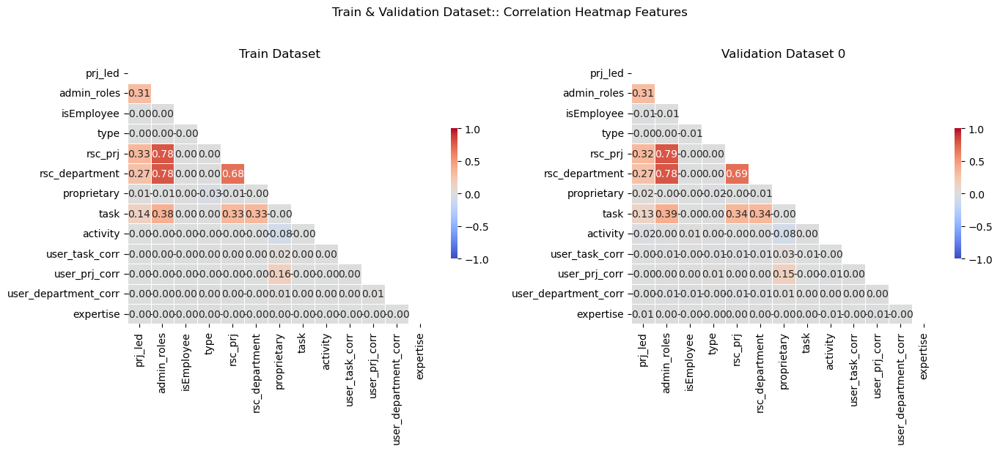

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

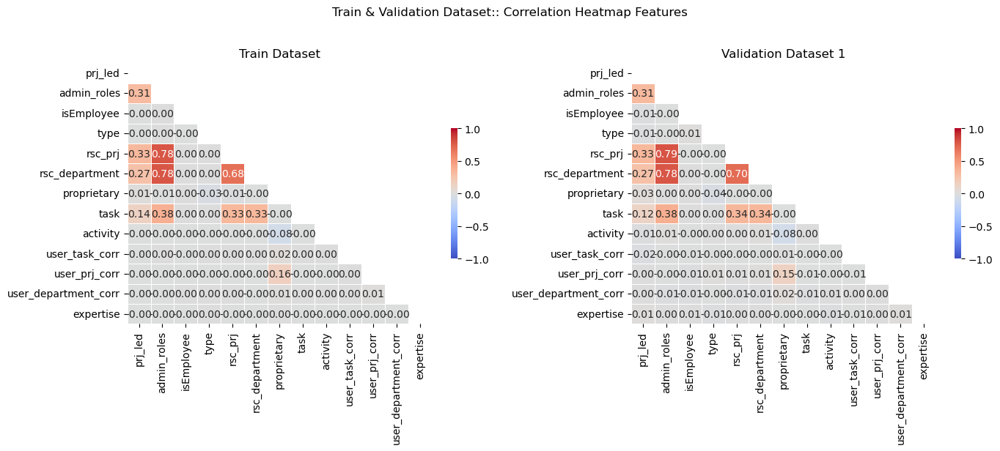

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

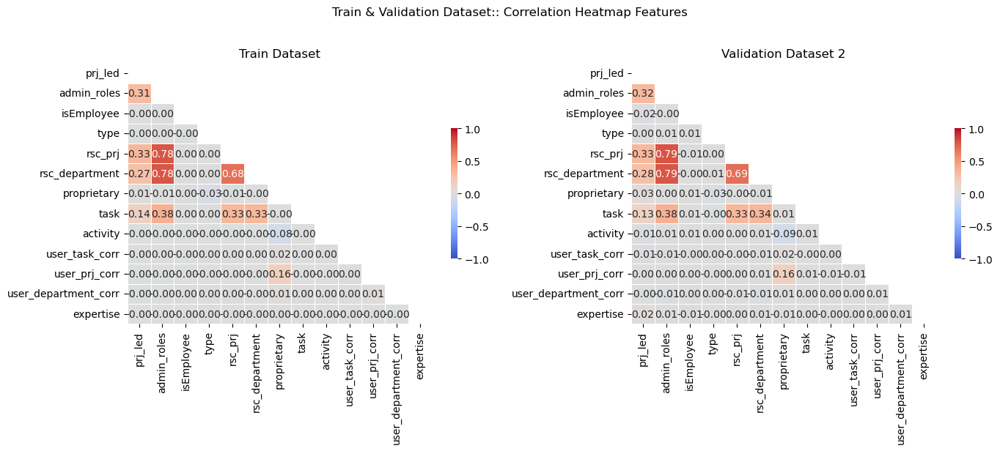

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

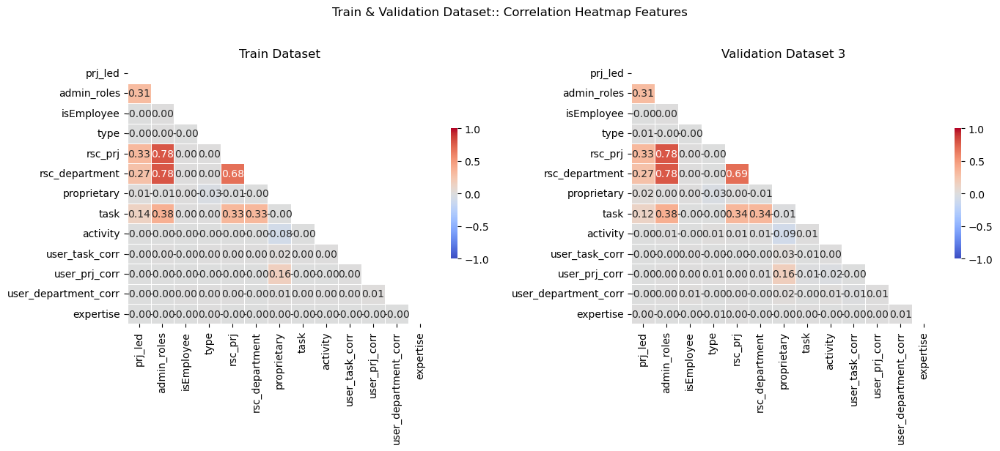

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

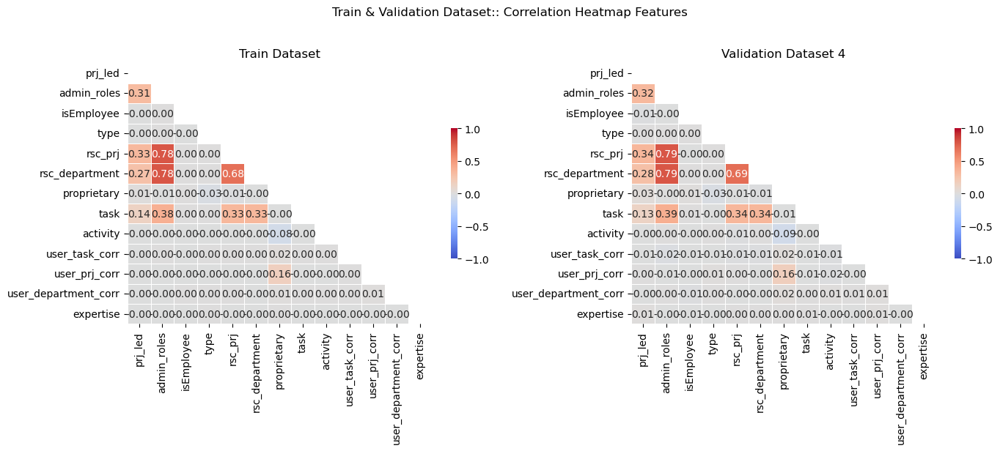

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

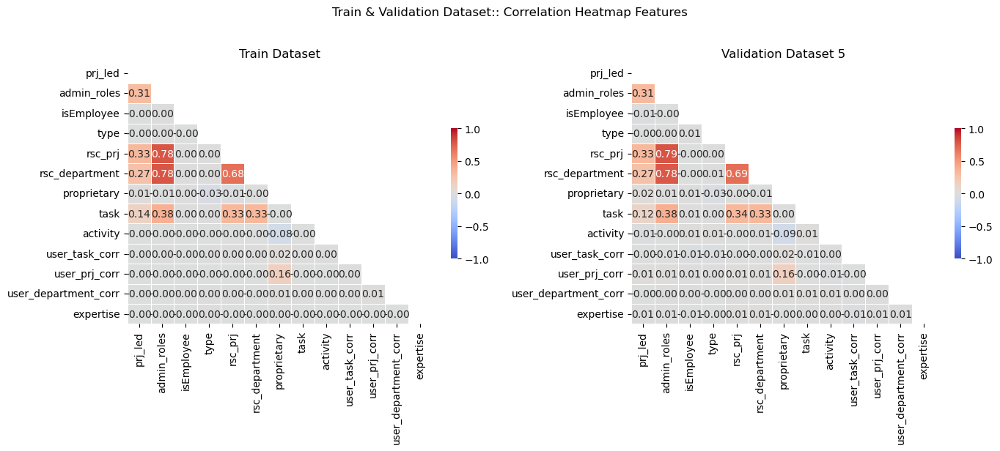

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

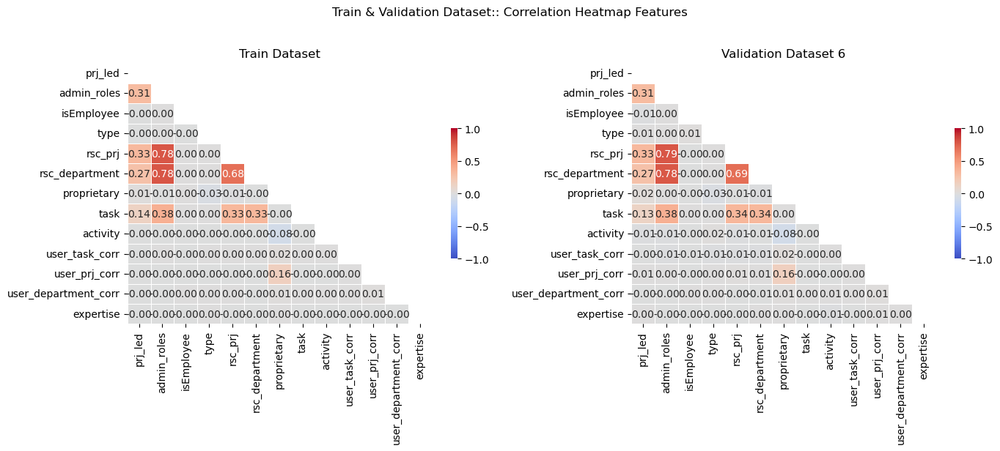

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

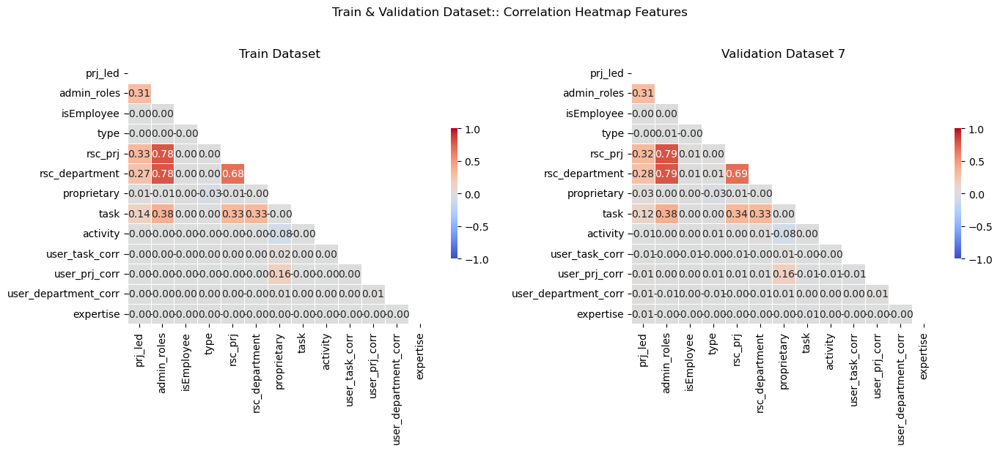

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

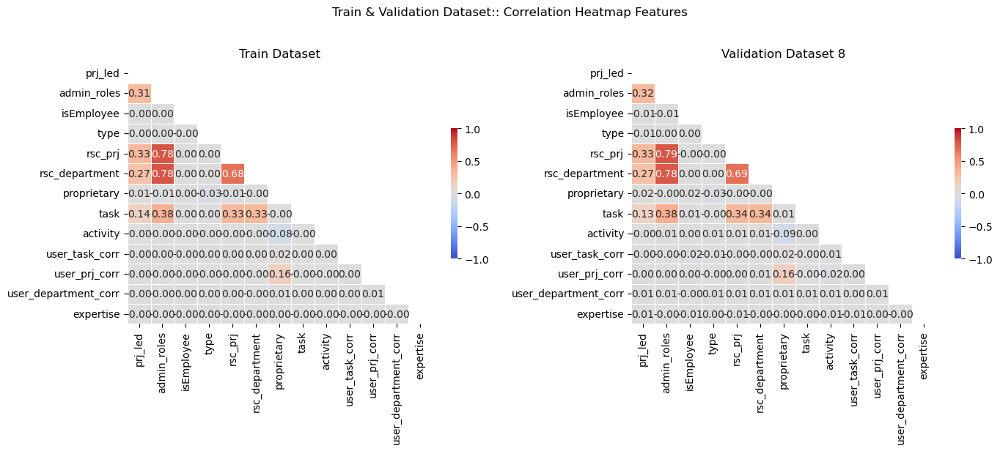

Image saved to: ./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features.png

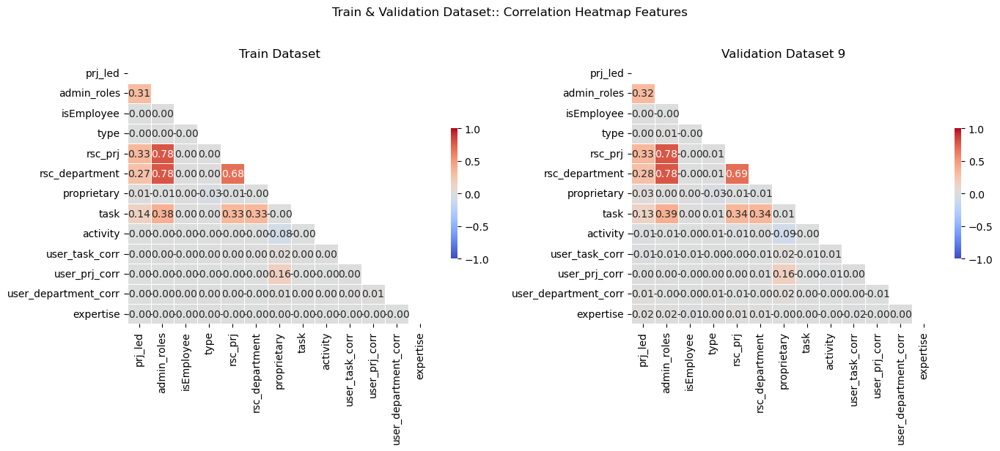

In [239]:
i = 0
for _x_validation in _x_validation_pool:
    plot_correlation_heatmap_side_by_side(train_df=_x_train.drop(columns=['action']),
                                          test_df=_x_validation.drop(columns=['action']),
                                          plot_title= 'Train & Validation Dataset:: Correlation Heatmap Features',
                                          save_plot=True,
                                          save_image_path='./abac_research_outputs/plots/train_n_validation_ds_correlation_heatmap_features',
                                         right_title = f'Validation Dataset {i}')
    i += 1

del i

#### Train & Test Dataset:: Correlation Heatmap Features

Image saved to: ./abac_research_outputs/plots/train_n_test_ds_correlation_heatmap_features.png

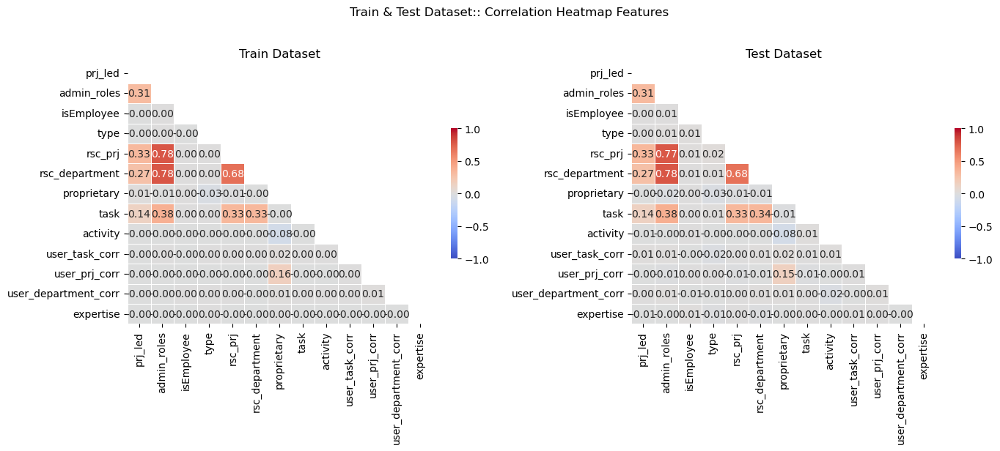

In [39]:
plot_correlation_heatmap_side_by_side(train_df=_x_train.drop(columns=['action']),
                                      test_df=_x_test.drop(columns=['action']),
                                      plot_title= 'Train & Test Dataset:: Correlation Heatmap Features',
                                      save_plot=True,
                                      save_image_path='./abac_research_outputs/plots/train_n_test_ds_correlation_heatmap_features')

#### Train & Test Dataset:: Feature Correlation Relplot

Image saved to: ./abac_research_outputs/plots/train_n_test_ds_correlation_relplot.png

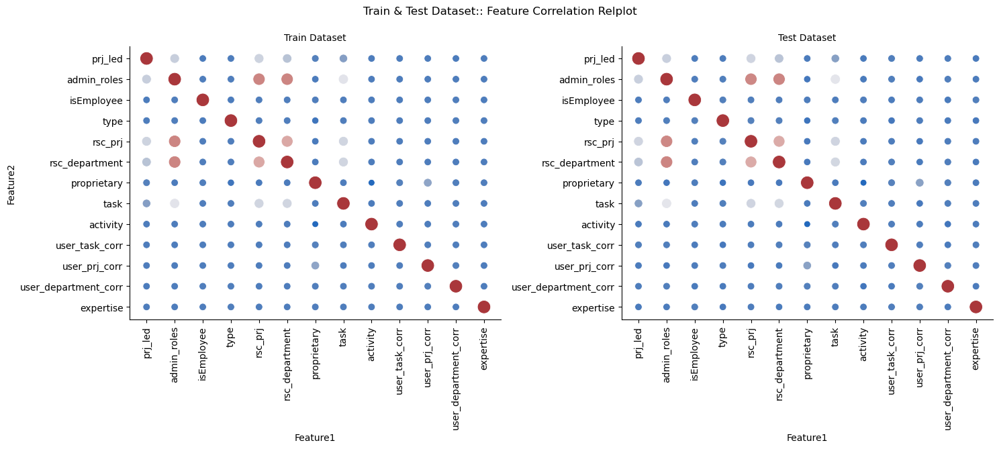

In [40]:
plot_correlation_relplot_grid(train_df=_x_train.drop(columns=['action']),
                              test_df=_x_test.drop(columns=['action']),
                              plot_title= 'Train & Test Dataset:: Feature Correlation Relplot',
                              save_plot=True,
                              save_image_path='./abac_research_outputs/plots/train_n_test_ds_correlation_relplot')

#### Train Feature Distributions

Image saved to: ./abac_research_outputs/plots/train_ds_feature_distributions.png

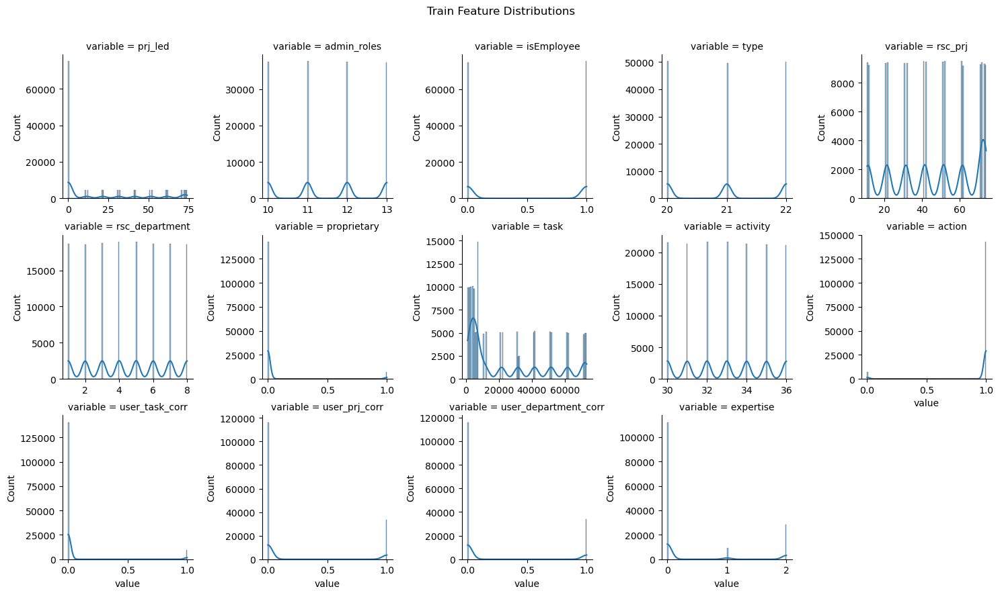

In [41]:
plot_dataset_feature_distributions(_df=_x_train, plot_title='Train Feature Distributions', 
                                   save_plot=True, save_image_path='./abac_research_outputs/plots/train_ds_feature_distributions')

#### Validation Feature Distributions

Image saved to: ./abac_research_outputs/plots/validation_ds_feature_distributions.png

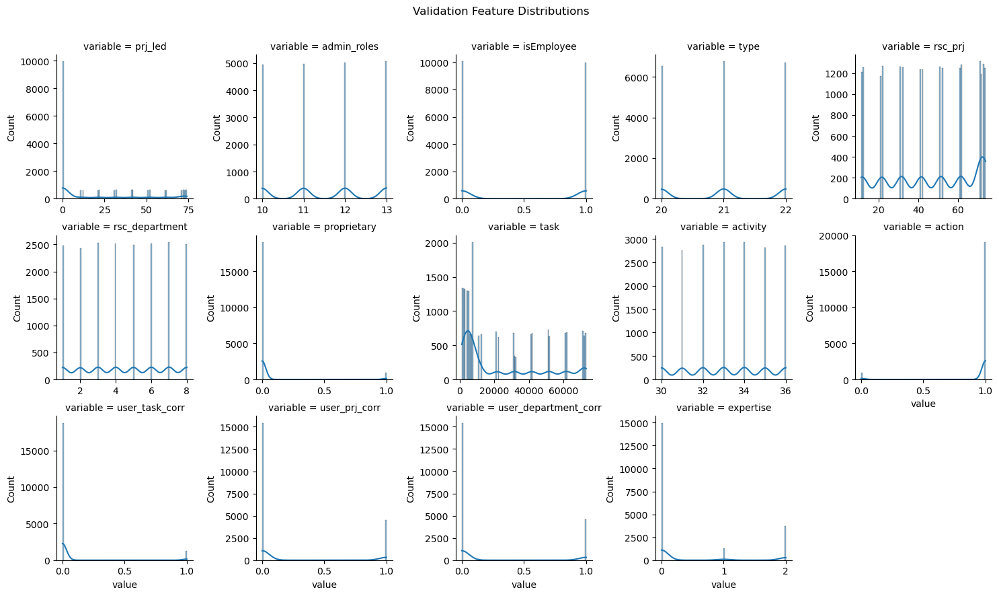

In [42]:
plot_dataset_feature_distributions(_df=_x_validation, plot_title='Validation Feature Distributions', 
                                   save_plot=True, save_image_path='./abac_research_outputs/plots/validation_ds_feature_distributions')

#### Test Feature Distributions

Image saved to: ./abac_research_outputs/plots/test_ds_feature_distributions.png

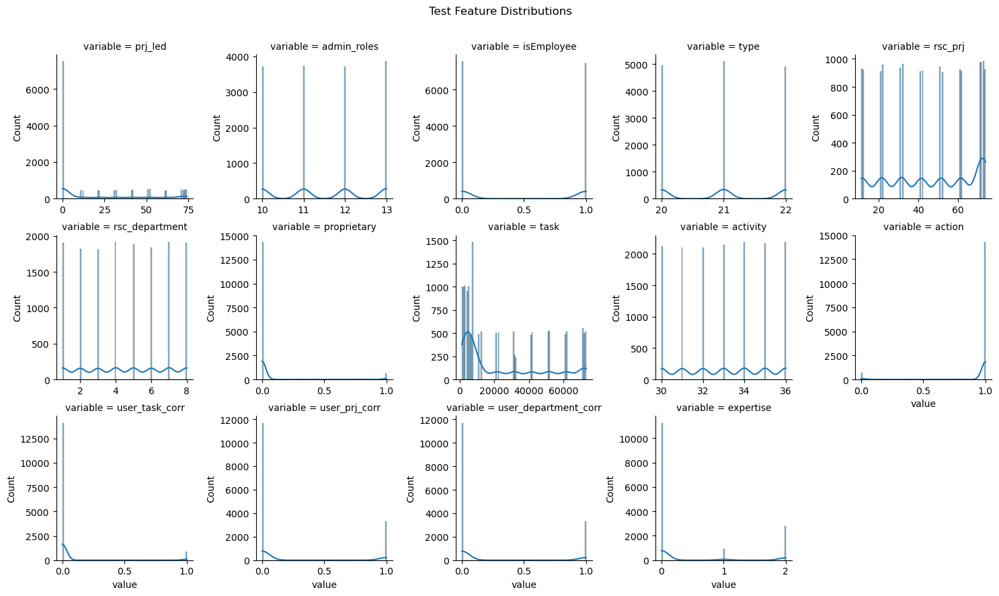

In [43]:
plot_dataset_feature_distributions(_df=_x_test, plot_title='Test Feature Distributions', 
                                   save_plot=True, save_image_path='./abac_research_outputs/plots/test_ds_feature_distributions')

### Insights

#### Full match cases

We wish to find full match cases between the training dataset and the testing dataset

In [68]:
full_join_features = dataframe_features.copy()
full_match_df = pd.merge(_x_train, _x_test.reset_index(), on=dataframe_features, how='inner').drop_duplicates()
pprint(f"Train & Test cross data size: {len(full_match_df):,}. represnting: {(len(full_match_df)/(len(_x_train) + len(_x_test)))*100:.3f}%")

Train & Test cross data size: 2,967. represnting: 1.798%

In [69]:
full_join_features = dataframe_features.copy()
full_match_df = pd.merge(_x_train, _x_validation.reset_index(), on=dataframe_features, how='inner').drop_duplicates()
pprint(f"Train & Validation cross data size: {len(full_match_df):,}. represnting: {(len(full_match_df)/(len(_x_train) + len(_x_validation)))*100:.3f}%")

Train & Validation cross data size: 3,988. represnting: 2.346%

# Model Training

## Configurations

### Linkage configuration

In [70]:
linkage_method = 'average'
linkage_metric = 'cosine'

### Insights configurations

In [71]:
complete_mgr_ftrs = ['admin_roles', 'activity', 'action']

selected_4_mgr_ftrs = ['task', 'prj_led', 'isEmployee', 'type', 'rsc_prj', 'rsc_department',
                       'proprietary', 'user_task_corr', 'user_prj_corr', 
                       'user_department_corr', 'expertise']

manager_features = ['prj_led', 'isEmployee', 'type', 'rsc_prj', 'rsc_department',
                    'proprietary', 'user_task_corr', 'user_prj_corr', 
                    'user_department_corr', 'expertise', 'task',
                   'activity', 'action']

manager_independent_features =['prj_led', 'isEmployee', 'type', 'rsc_prj', 'rsc_department',
                               'proprietary', 'user_task_corr', 'user_prj_corr', 
                               'user_department_corr', 'expertise']

In [72]:
def get_linkage_by_mgrId(mgr_id: str, _df: pd.DataFrame = None, 
                         mgr_Z_arrays_folder:str = './abac_research_outputs/mgr_Z_arrays/',
                         mgr_dataframe_folder:str = './abac_research_outputs/mgr_dataframe/',
                         mgr_Z_dataframe_folder:str = './abac_research_outputs/mgr_Z_dataframe/'):
    try:

        _mgr_lean_flag = False
        
        mgr_Z_arrays_path = '{0}mgr_{1}_Z.npy'.format(mgr_Z_arrays_folder, mgr_id)
        mgr_dataframe_path = '{0}mgr_{1}_df.csv'.format(mgr_dataframe_folder, mgr_id)
        mgr_Z_dataframe_path = '{0}mgr_{1}_df.csv'.format(mgr_Z_dataframe_folder, mgr_id)

        if os.path.exists(mgr_Z_arrays_path):
            Z = np.load(mgr_Z_arrays_path)
            _mgr_df = pd.read_csv(mgr_dataframe_path, index_col=0)
            Z_df = pd.read_csv(mgr_Z_dataframe_path, index_col=0)
        else:
            query = f'admin_roles == {mgr_id}'
            _mgr_df = _df.query(query)
            _mgr_df.to_csv(mgr_dataframe_path, index=True)
            
            _mgr_lean_df = _mgr_df.copy()
            _mgr_lean_df = _mgr_lean_df.drop(complete_mgr_ftrs, axis=1)
    
            if len(_mgr_lean_df) > 1:
                _mgr_oh_df = pd.get_dummies(_mgr_lean_df, columns=selected_4_mgr_ftrs)
                Z = shc.linkage(_mgr_oh_df, method=linkage_method, metric=linkage_metric)
                np.save(mgr_Z_arrays_path, Z)
                
                Z_df = pd.DataFrame(data=Z, columns=['node_a', 'node_b', 'dist', 'audi'])
                Z_df.to_csv(mgr_Z_dataframe_path, index=True)
            else:
                _mgr_lean_flag = True

        if _mgr_lean_flag:
            return None, _mgr_df, None
        else:
            return Z_df, _mgr_df, Z

    except Exception as e:
        pprint(
            "An error occurred while getting statistics for mgr_id: %s. %s", mgr_id, e)
        return None, None, None


In [73]:
def Merge(dict1, dict2):
    res = dict1 | dict2
    return res

In [74]:
def retrieve_query_string(data):
    return " and ".join(f"{key} == {value}" for key, value in data.items() if is_not_none_or_null(value))

In [75]:
def is_not_none_or_null(value):
    return value is not None and value != 'null'

In [76]:
def analyze_manager_resource_propabilities(mgr_id: str, relevant_df: pd.DataFrame, 
                                           Z_df: pd.DataFrame, x_train_df: pd.DataFrame):
    
    relevant_clone_df = relevant_df.copy()
    relevant_clone_df.reset_index(drop=True, inplace=True)
    relevant_clone_manager_features_df = relevant_clone_df[manager_features].copy()
    relevant_clone_len = len(relevant_clone_df)
    records_indices = [[i] for i in range(relevant_clone_len)]

    activity_counts_df = relevant_clone_df.groupby('activity').size().reset_index(name='Count')
    activity_list = activity_counts_df.to_dict(orient='records')
    activity_dict = {str(item['activity']): item['Count'] for item in activity_list}

    # all existing activities known in the abac platform
    activity_dict = Merge({
        '30': math.nan,
        '31': math.nan,
        '32': math.nan,
        '33': math.nan,
        '34': math.nan,
        '35': math.nan,
        '36': math.nan}, activity_dict)

    node_rsc_propabilities_ptr = 0

    node_rsc_propabilities = dict()

    for i, r in Z_df.iterrows():
        entry = dict()
        node_a_index = int(r['node_a'])
        node_b_index = int(r['node_b'])
        _indices = records_indices[node_a_index] + records_indices[node_b_index]
        records_indices.append(_indices)
    
        lean_slice_df = relevant_clone_manager_features_df.iloc[_indices]
    
        node_segment = dict()
        for col in manager_independent_features:
            unique_values = lean_slice_df[col].unique()
            if len(unique_values) == 1:
                node_segment[col] = unique_values[0]
            else:
                node_segment[col] = None
                
        query_string = retrieve_query_string(node_segment)
        hash_code = str(hash(query_string))
        if hash_code not in node_rsc_propabilities:
            lean_node_segment = {key: int(value) for key, value in node_segment.items() if value is not None}
            node_rsc_propabilities[hash_code]={
                "node_segment": lean_node_segment,
                "query": query_string
            }

    return node_rsc_propabilities

In [77]:
%%time
def calculate_managers_linkage_n_resource_propabilities(
    override_g_analyze_object = False,
    mgr_Z_nodes_folder:str = './abac_research_outputs/mgr_Z_nodes/',
    mgrs_Z_nodes_folder:str = './abac_research_outputs/mgrs_Z_nodes/'):

    basic_mgrs_Z_nodes_path = '{0}basic_mgrs_Z_nodes.json'.format(mgrs_Z_nodes_folder)
    
    _g_analyze_object = dict()
    send_existing_flag = False
    
    if not override_g_analyze_object:
        if os.path.exists(basic_mgrs_Z_nodes_path):
            pprint('Existing file at: {0}'.format(basic_mgrs_Z_nodes_path))
            with open(basic_mgrs_Z_nodes_path, 'r') as file:
                _g_analyze_object = json.load(file)
            send_existing_flag = True

    if send_existing_flag:
        return _g_analyze_object
    
    unique_mgr_list = list(_x_train['admin_roles'].drop_duplicates().to_list())
    unique_mgr_list.sort()

    bar_column = BarColumn(bar_width=None, table_column=Column(ratio=2))
    progress = Progress('Processing managers', bar_column, expand=True)
    with progress:
        for mgr_id in progress.track(unique_mgr_list):
            Z_df, _mgr_df, Z = get_linkage_by_mgrId(mgr_id= str(mgr_id), _df= _x_train)
        
            if Z_df is not None:
                mgr_Z_nodes_path = '{0}mgr_{1}_Z_nodes.json'.format(mgr_Z_nodes_folder, mgr_id)
                pprint(mgr_Z_nodes_path)

                if os.path.exists(mgr_Z_nodes_path):
                    with open(mgr_Z_nodes_path, 'r') as file:
                        analyze_object = json.load(file)
                    _g_analyze_object.update(analyze_object)
                else:

                    try:
                        analyze_object =analyze_manager_resource_propabilities(
                            relevant_df=_mgr_df, mgr_id=mgr_id, Z_df=Z_df, x_train_df=_x_train)
                        
                        with open(mgr_Z_nodes_path, 'w') as f:
                            json.dump(analyze_object, f, indent=4)

                        _g_analyze_object.update(analyze_object)
                    except Exception as e:
                        print(f"An error occurred: {e}")
                
    del bar_column
    del progress

    with open(basic_mgrs_Z_nodes_path, 'w') as f:
        json.dump(_g_analyze_object, f, indent=4)

    return _g_analyze_object

CPU times: user 9 µs, sys: 2 µs, total: 11 µs
Wall time: 22.9 µs


In [78]:
%%time
basic_analyze_object = calculate_managers_linkage_n_resource_propabilities()

Output()

./abac_research_outputs/mgr_Z_nodes/mgr_10_Z_nodes.json

./abac_research_outputs/mgr_Z_nodes/mgr_11_Z_nodes.json

./abac_research_outputs/mgr_Z_nodes/mgr_12_Z_nodes.json

./abac_research_outputs/mgr_Z_nodes/mgr_13_Z_nodes.json

CPU times: user 4min 9s, sys: 1min 32s, total: 5min 42s
Wall time: 5min 58s


Example for Linkage Tree of Manager: 10

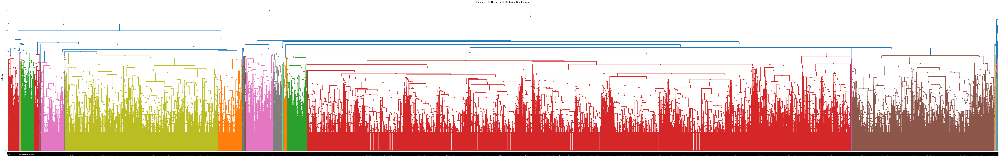

In [79]:
pprint(f'Example for Linkage Tree of Manager: 10')
plot_hierarchical_cluster_fancy_detailed(mgr_id=10)

Example for Linkage Tree of Manager: 11

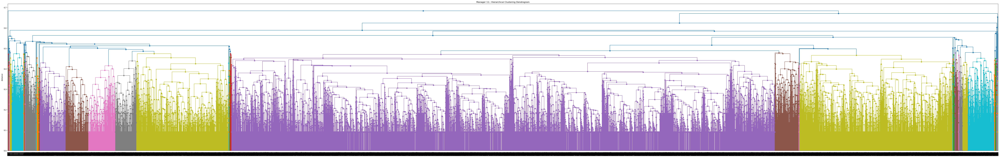

In [80]:
pprint(f'Example for Linkage Tree of Manager: 11')
plot_hierarchical_cluster_fancy_detailed(mgr_id=11)

Example for Linkage Tree of Manager: 12

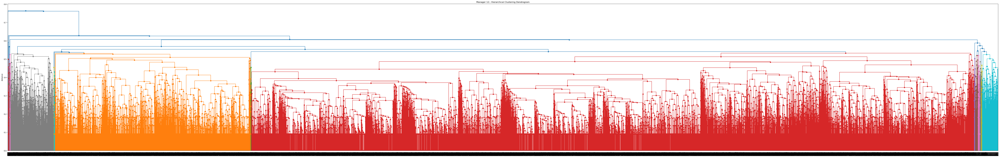

In [81]:
pprint(f'Example for Linkage Tree of Manager: 12')
plot_hierarchical_cluster_fancy_detailed(mgr_id=12)

Example for Linkage Tree of Manager: 13

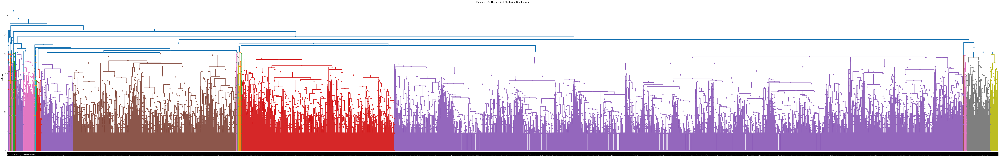

In [82]:
pprint(f'Example for Linkage Tree of Manager: 13')
plot_hierarchical_cluster_fancy_detailed(mgr_id=13)

## Extract Insights

### get_resource_insights

Calculate the mean of the found resources at each node. w/o break it by Action 

In [83]:
def get_resource_insights(_df:pd.DataFrame) -> dict:
    input_list = _df.groupby(['task']).agg(
        Audi=('task', 'count'),
        AR = ('action', 'mean'),).\
        reset_index().sort_values(by=['task'], ascending=True).\
        to_dict('records')
    
    output_dict = {}
    
    for item in input_list:
        resource_id = str(item['task'])
        if resource_id not in output_dict:
            output_dict[resource_id] = {}
        output_dict[resource_id] = {'AR': item['AR'], 'Audi': item['Audi']}

    return output_dict

### get_trends_insights

Calculate the mean of the found resources at each node. with break it by Action 

In [84]:
def get_trends_insights(_df:pd.DataFrame) -> dict:
    input_list = _df.groupby(['task', 'activity']).agg(
        Audi=('task', 'count'),
        AR = ('action', 'mean'),).\
        reset_index().sort_values(by=['task', 'activity'], ascending=True).\
        to_dict('records')
    
    output_dict = {}
    
    for item in input_list:
        resource_id = str(item['task'])
        activity = str(item['activity'])
        if resource_id not in output_dict:
            output_dict[resource_id] = {}
        output_dict[resource_id][activity] = {'AR': item['AR'], 'Audi': item['Audi']}

    return output_dict

### get_mgr_insights

Calculate the mean of the found resources at each node. with break it by Action and the Manager

In [85]:
def get_mgr_insights(_df:pd.DataFrame) -> dict:
    input_list = _df.groupby(['task', 'admin_roles', 'activity']).agg(
        Audi=('task', 'count'),
        AR = ('action', 'mean'),).\
        reset_index().sort_values(by=['task', 'admin_roles', 'activity'], ascending=True).\
        to_dict('records')
    
    output_dict = {}
    
    for item in input_list:
        resource_id = str(item['task'])
        manager_id = str(item['admin_roles'])
        activity = str(item['activity'])
        if resource_id not in output_dict:
            output_dict[resource_id] = {}
        if manager_id not in output_dict[resource_id]:
            output_dict[resource_id][manager_id] = {}
        output_dict[resource_id][manager_id][activity] = {'AR': item['AR'], 'Audi': item['Audi']}

    return output_dict

## Calculate Nodes Insights

calculate nodes insights, for all found nodes across all Linkage trees

In [86]:
def calculate_nodes_insights(g_analyze_object,
                             override_g_analyze_object = False,
                             mgrs_Z_nodes_folder:str = './abac_research_outputs/mgrs_Z_nodes/'):

    insights_mgrs_Z_nodes_path = '{0}insights_mgrs_Z_nodes.json'.format(mgrs_Z_nodes_folder)
    _g_analyze_object = copy.deepcopy(g_analyze_object)
    
    send_existing_flag = False
    if not override_g_analyze_object:
        if os.path.exists(insights_mgrs_Z_nodes_path):
            pprint('Existing file at: {0}'.format(insights_mgrs_Z_nodes_path))
            with open(insights_mgrs_Z_nodes_path, 'r') as file:
                _g_analyze_object = json.load(file)
            send_existing_flag = True

    if send_existing_flag:
        return _g_analyze_object
    
    bar_column = BarColumn(bar_width=None, table_column=Column(ratio=2))
    progress = Progress('Processing Nodes', bar_column, expand=True)
    with progress:
        for element_key in progress.track(_g_analyze_object.keys()):
            element = _g_analyze_object[element_key]
            if element['query'] is None or element['query'] == '':
                element['match_points_count'] = len(element['node_segment'])
                element['resource_insights'] = None
                element['trends_insights'] = None
                element['mgr_insights'] = None
            else:
                element_df = _x_train.query(element['query'])
                element['match_points_count'] = len(element['node_segment'])
                element['resource_insights'] = get_resource_insights(element_df)
                element['trends_insights'] = get_trends_insights(element_df)
                element['mgr_insights'] = get_mgr_insights(element_df)
    
    
    del bar_column
    del progress
    
    with open(insights_mgrs_Z_nodes_path, 'w') as f:
        json.dump(_g_analyze_object, f)

    return _g_analyze_object

In [87]:
%%time
insights_analyze_object = calculate_nodes_insights(basic_analyze_object)

Output()

CPU times: user 4min 54s, sys: 15.4 s, total: 5min 9s
Wall time: 4min 8s


In [103]:
pprint(insights_analyze_object['-381990835389274468']['resource_insights']['1120'])

{'AR': 0.5, 'Audi': 2}

In [105]:
pprint(insights_analyze_object['-381990835389274468']['trends_insights']['1120'])

{'34': {'AR': 0.0, 'Audi': 1}, '36': {'AR': 1.0, 'Audi': 1}}

In [101]:
pprint(insights_analyze_object['-381990835389274468']['mgr_insights']['1120'])

{'10': {'34': {'AR': 0.0, 'Audi': 1}}, '12': {'36': {'AR': 1.0, 'Audi': 1}}}

In [106]:
def generate_subsets(data, match_points_count_lim: int):
    keys = list(data.keys())
    for r in range(len(keys), (match_points_count_lim - 1), -1):  # Iterate from full combination to 1 match
        for subset_keys in combinations(keys, r):
            subset = {key: data[key] for key in subset_keys}
            yield subset

In [107]:
def get_validation_stat (g_analyze_object, _df:pd.DataFrame, match_points_count_lim: int = 3):
    entry_match_cases = []
    entry_no_match_cases = []

    with tqdm(total=len(_df)) as pbar:
        for ind, test_row in _df.iterrows():
            
            mgr_id = test_row['admin_roles']
            str_mgr_id = str(mgr_id)
            
            rsc_id = test_row['task']
            str_rsc_id = str(rsc_id)

            activity = test_row['activity']
            str_activity = str(activity)
            
            action = test_row['action']
            test_row_dict = test_row[manager_independent_features].to_dict()


            base_entry_match_case = {
                'ind': ind,
                'mgr_id': mgr_id,
                'rsc_id': rsc_id,
                'action': action,
                'activity': activity
            }

            # no_comb_found = True
            all_combinations = list(generate_subsets(data = test_row_dict, match_points_count_lim = match_points_count_lim))

            for combination in all_combinations:
                
                # no_comb_found = True
                
                query_string = retrieve_query_string(combination)
                hash_code = str(hash(query_string))
                

                if hash_code in g_analyze_object:
                    match_points_count = g_analyze_object[hash_code]['match_points_count']
                #     if match_points_count < match_points_count_lim:
                #         continue
                    # if str(rsc_id) not in g_analyze_object[hash_code]['resource_insights']:
                    #     continue
                    curr_entry_match_case = copy.deepcopy(base_entry_match_case)
                    curr_entry_match_case['hash_code'] = hash_code
                    curr_entry_match_case['match_points_count'] = match_points_count

                    if str_rsc_id in g_analyze_object[hash_code]['resource_insights']:
                        resource_insights = g_analyze_object[hash_code]['resource_insights'][str_rsc_id]

                        entry_match_case_inst = copy.deepcopy(curr_entry_match_case)
                        entry_match_case_inst['match_mode'] = 'resource_insights' # <-- Resource-Insights
                        entry_match_case_inst['ar'] = resource_insights['AR']
                        entry_match_case_inst['audi'] = resource_insights['Audi']
                        entry_match_cases.append(entry_match_case_inst)


                    if str_rsc_id in g_analyze_object[hash_code]['trends_insights']:
                        trends_insights = g_analyze_object[hash_code]['trends_insights'][str_rsc_id]
                        if str_activity in trends_insights: # --> same Resource + Activity
                            entry_match_case_inst = copy.deepcopy(curr_entry_match_case)
                            entry_match_case_inst['match_mode'] = 'trends_insights' # <-- Resource-Activity-Insights
                            entry_match_case_inst['ar'] = trends_insights[str_activity]['AR']
                            entry_match_case_inst['audi'] = trends_insights[str_activity]['Audi']
                            entry_match_cases.append(entry_match_case_inst)

                    
                    if str_rsc_id in g_analyze_object[hash_code]['mgr_insights']:
                        mgr_insights  = g_analyze_object[hash_code]['mgr_insights'][str_rsc_id]
                        if str_mgr_id in mgr_insights:
                            if str_activity in mgr_insights[str_mgr_id]:
                                entry_match_case_inst = copy.deepcopy(curr_entry_match_case)
                                entry_match_case_inst['match_mode'] = 'mgr_insights'  # --> Manager-Insights
                                entry_match_case_inst['ar'] = mgr_insights[str_mgr_id][str_activity]['AR']
                                entry_match_case_inst['audi'] = mgr_insights[str_mgr_id][str_activity]['Audi']
                                entry_match_cases.append(entry_match_case_inst)
                            else: 
                                t_audi = 0
                                t_ar = 0.0
                                for k in mgr_insights[str_mgr_id].keys():
                                    t_audi += mgr_insights[str_mgr_id][k]['Audi']
                                    t_ar += mgr_insights[str_mgr_id][k]['Audi'] * mgr_insights[str_mgr_id][k]['AR']
                                sAVG_AR = t_ar/ t_audi
                                entry_match_case_inst = copy.deepcopy(curr_entry_match_case)
                                entry_match_case_inst['match_mode'] = 'mgr_activity_insights'
                                entry_match_case_inst['ar'] = sAVG_AR
                                entry_match_case_inst['audi'] = t_audi
                                entry_match_cases.append(entry_match_case_inst)
                        else: # --> Resource - Manager + Activity
                            t_audi = 0
                            t_ar = 0.0

                            for k_mgr in mgr_insights.keys(): # --> relative managers
                                str_k_mgr = str(k_mgr)
                                if str_activity in mgr_insights[str_k_mgr]:
                                    t_audi += mgr_insights[str_k_mgr][str_activity]['Audi']
                                    t_ar   += mgr_insights[str_k_mgr][str_activity]['Audi'] * mgr_insights[str_k_mgr][str_activity]['AR']
                                    
                                    sAVG_AR = t_ar/ t_audi
                                    entry_match_case_inst = copy.deepcopy(curr_entry_match_case)
                                    entry_match_case_inst['match_mode'] = 'similar_mgrs_rsc_actv_insights' # --> Similar-Manager-Insights
                                    entry_match_case_inst['ar'] = sAVG_AR
                                    entry_match_case_inst['audi'] = t_audi
                                    entry_match_cases.append(entry_match_case_inst)
            else:
                # if no_comb_found:
                entry_no_match_cases.append(test_row)

            
            pbar.update(1)
    
    pprint('Done')
    return pd.DataFrame(entry_match_cases), pd.DataFrame(entry_no_match_cases)

## Train Data

In [108]:
%%time
train_results_allow_df, train_results_allow_out_df = \
    get_validation_stat(insights_analyze_object, _df = _x_train.query('action == 1'),
                       match_points_count_lim = 1)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 142882/142882 [09:29<00:00, 250.90it/s]


Done

CPU times: user 8min 17s, sys: 2min 8s, total: 10min 25s
Wall time: 14min 10s


In [109]:
pprint(f"Train Allow Results match: {len(train_results_allow_df):,}")
pprint(f"Train Allow Results match-not-found: {len(train_results_allow_out_df):,}")

Train Allow Results match: 59,784,996

Train Allow Results match-not-found: 142,882

In [110]:
%%time
train_results_deny_df, train_results_deny_out_df = \
    get_validation_stat(insights_analyze_object, _df = _x_train.query('action == 0'),
                       match_points_count_lim = 1)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7118/7118 [00:35<00:00, 201.57it/s]


Done

CPU times: user 21.7 s, sys: 5.5 s, total: 27.2 s
Wall time: 38.4 s


In [111]:
pprint(f"Train Deny Results match: {len(train_results_deny_df):,}")
pprint(f"Train Deny Results match-not-found: {len(train_results_deny_out_df):,}")

Train Deny Results match: 2,380,191

Train Deny Results match-not-found: 7,118

In [112]:


train_results_allow_df.to_parquet(f'./abac_research_outputs/model/train_results_allow.parquet', engine='pyarrow', index=True)
train_results_deny_df.to_parquet(f'./abac_research_outputs/model/train_results_deny.parquet', engine='pyarrow', index=True)

### Show match points distribution Allow and Deny

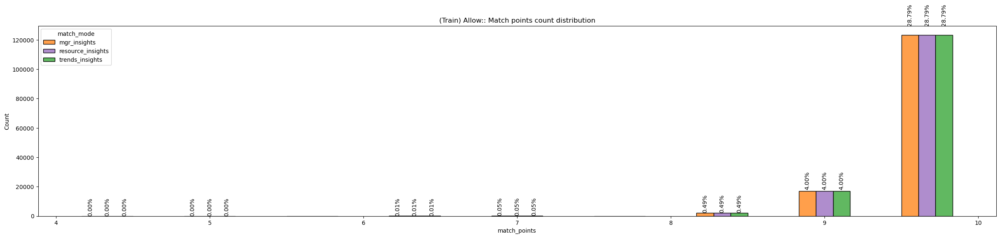

In [113]:
train_results_allow_distribution_df=plot_match_points_count_distribution(train_results_allow_df, '(Train) Allow:: Match points count distribution')
# train_results_allow_distribution_df.sort_values(by=['match_points','%'])

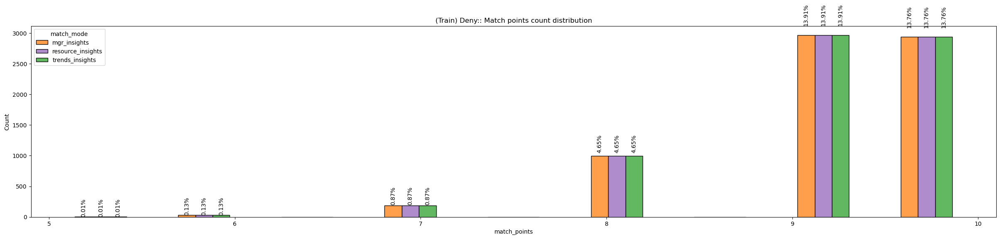

In [114]:
train_results_deny_distribution_df=plot_match_points_count_distribution(train_results_deny_df, '(Train) Deny:: Match points count distribution')
# train_results_deny_distribution_df.sort_values(by=['match_points','%'])

## Validation Data

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:20<00:00, 248.73it/s]


Done

Validation (0) Allow Results match: 8,067,235

Validation (0) Allow Results match-not-found: 20,000

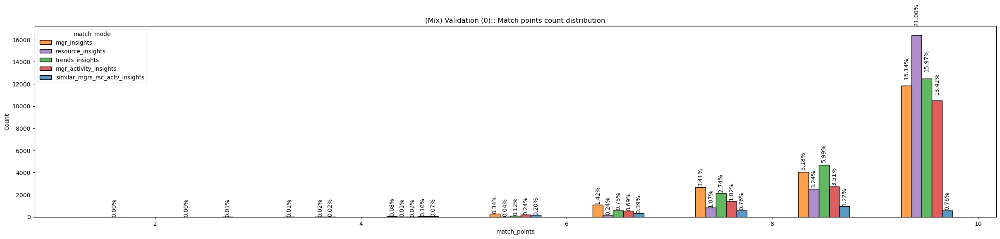

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:13<00:00, 271.22it/s]


Done

Validation (1) Allow Results match: 8,063,857

Validation (1) Allow Results match-not-found: 20,000

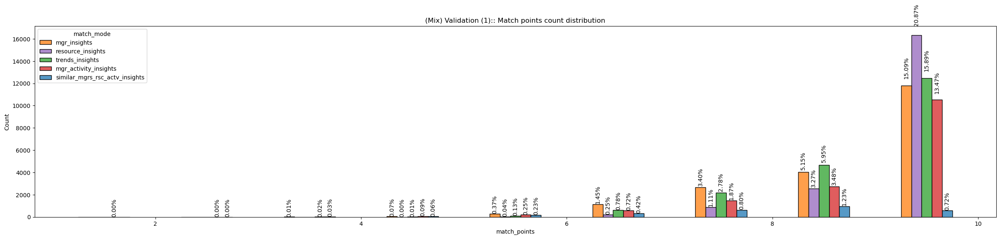

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:09<00:00, 286.30it/s]


Done

Validation (2) Allow Results match: 8,047,132

Validation (2) Allow Results match-not-found: 20,000

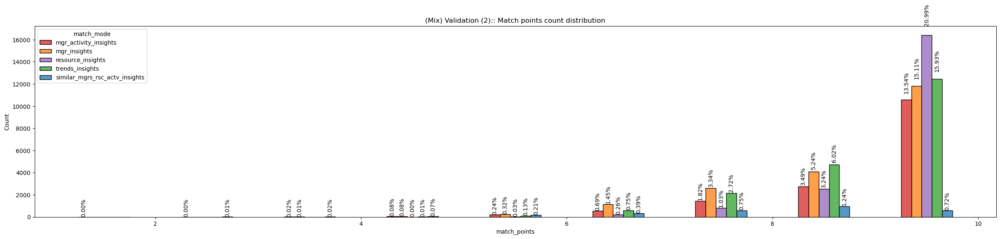

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:13<00:00, 273.79it/s]


Done

Validation (3) Allow Results match: 8,051,454

Validation (3) Allow Results match-not-found: 20,000

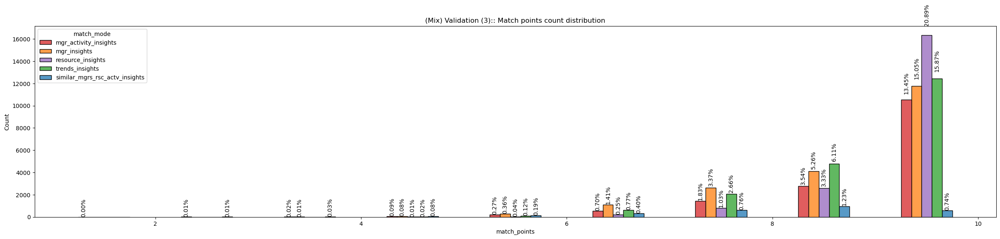

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:15<00:00, 266.48it/s]


Done

Validation (4) Allow Results match: 8,054,970

Validation (4) Allow Results match-not-found: 20,000

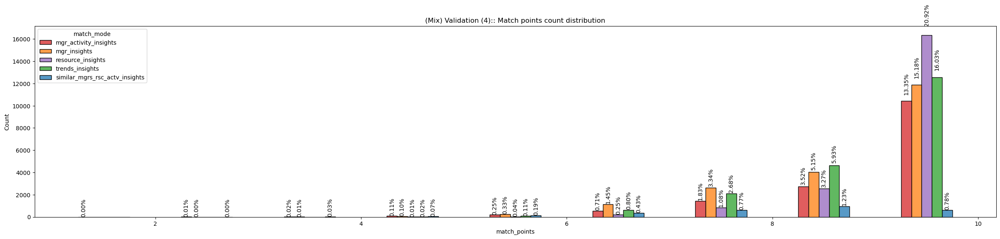

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:09<00:00, 285.72it/s]


Done

Validation (5) Allow Results match: 8,061,121

Validation (5) Allow Results match-not-found: 20,000

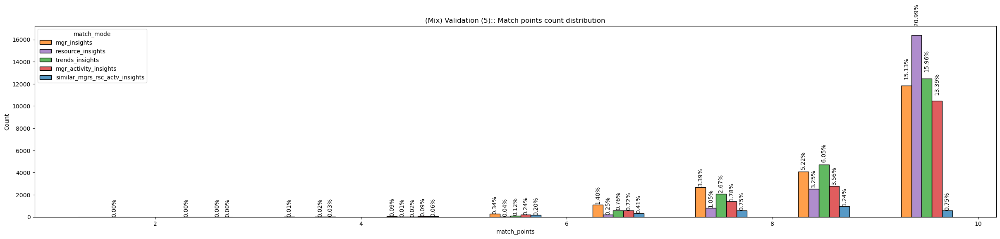

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:10<00:00, 283.35it/s]


Done

Validation (6) Allow Results match: 8,064,782

Validation (6) Allow Results match-not-found: 20,000

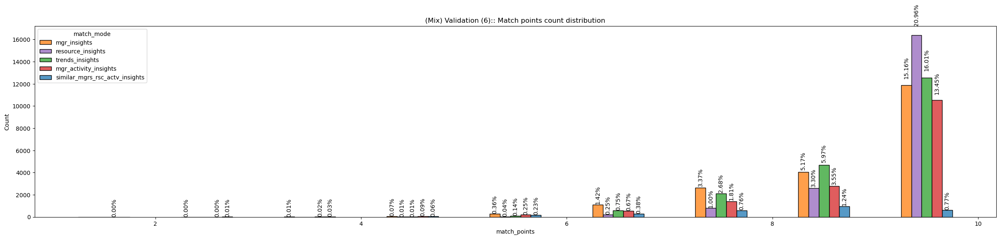

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:15<00:00, 264.74it/s]


Done

Validation (7) Allow Results match: 8,051,311

Validation (7) Allow Results match-not-found: 20,000

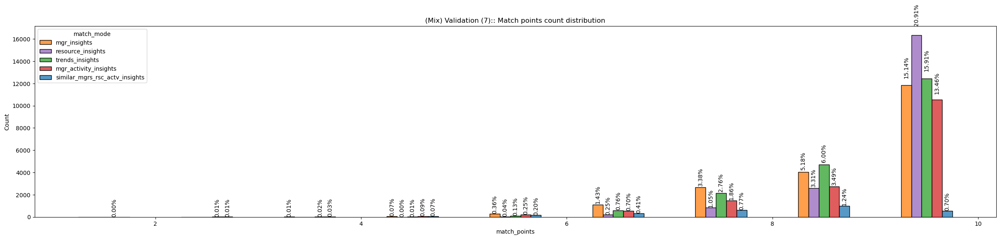

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:15<00:00, 266.28it/s]


Done

Validation (8) Allow Results match: 8,054,766

Validation (8) Allow Results match-not-found: 20,000

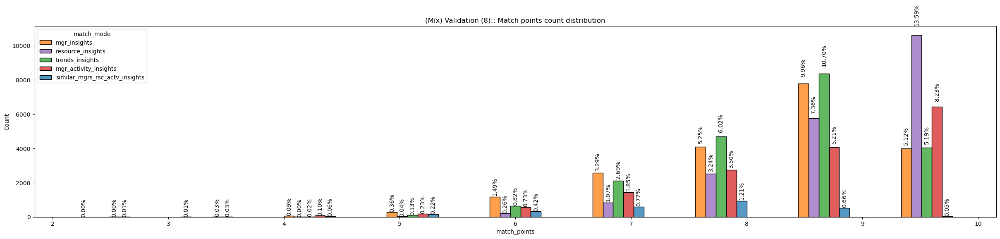

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:12<00:00, 274.78it/s]


Done

Validation (9) Allow Results match: 8,062,369

Validation (9) Allow Results match-not-found: 20,000

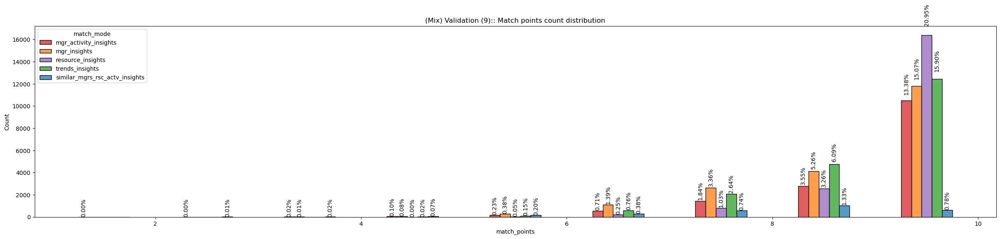

CPU times: user 11min 30s, sys: 1min 56s, total: 13min 27s
Wall time: 14min 18s


In [349]:
%%time
i = 0
validation_results_mix_pool = []
for _x_validation in _x_validation_pool:
    validation_results_mix_df, validation_results_mix_out_df = \
    get_validation_stat(insights_analyze_object, _df = _x_validation, match_points_count_lim = 1)
    
    validation_results_mix_pool.append(validation_results_mix_df)

    pprint(f"Validation ({i}) Allow Results match: {len(validation_results_mix_df):,}")
    pprint(f"Validation ({i}) Allow Results match-not-found: {len(validation_results_mix_out_df):,}")

    validation_results_mix_df.to_parquet(f'./abac_research_outputs/model/validation_results_mix_{i}_df.parquet', engine='pyarrow', index=True)
    validation_results_mix_out_df.to_parquet(f'./abac_research_outputs/model/validation_results_mix_{i}_out_df.parquet', engine='pyarrow', index=True)

    _=plot_match_points_count_distribution(validation_results_mix_df, f'(Mix) Validation ({i}):: Match points count distribution')

    i += 1

del i

## Identify Tresholds

### Split Validation Dataset

In [662]:
class CoverageFactor:
    """
    This class represents a coverage factor with parameters for allowed and denied sizes and coverages.

    Attributes:
        allow_size (int): Maximum allowed size for the image.
        deny_size (int): Minimum denied size for the image.
        allow_cover_size (int): Maximum allowed size for covered area.
        deny_cover_size (int): Minimum denied size for covered area.
        allow_cover_ratio (float): Maximum allowed ratio of image covered.
        deny_cover_ratio (float): Minimum denied ratio of image covered.
    """
    
    def __deepcopy__(self, memo):
        print("Deep copying...")
        new_object = CoverageFactor(self.allow_size, self.deny_size, self.allow_cover_size, self.deny_cover_size, self.allow_cover_ratio, self.deny_cover_ratio)
        return new_object

    def __init__(self, allow_size, deny_size, allow_cover_size, deny_cover_size, allow_cover_ratio, deny_cover_ratio):
        """
        Initializes the CoverageFactor object with the provided parameters.

        Args:
            allow_size (int): Maximum allowed size for the image.
            deny_size (int): Minimum denied size for the image.
            allow_cover_size (int): Maximum allowed size for covered area.
            deny_cover_size (int): Minimum denied size for covered area.
            allow_cover_ratio (float): Maximum allowed ratio of image covered.
            deny_cover_ratio (float): Minimum denied ratio of image covered.
        """
        self.allow_size = allow_size
        self.deny_size = deny_size
        self.allow_cover_size = allow_cover_size
        self.deny_cover_size = deny_cover_size
        self.allow_cover_ratio = allow_cover_ratio
        self.deny_cover_ratio = deny_cover_ratio

    def __str__(self):
        """
        Returns a string representation of the CoverageFactor object.
        """
        return (f"CoverageFactor(\tallow_size={self.allow_size} \n\t\tdeny_size={self.deny_size} \n\t\t"
                f"allow_cover_size={self.allow_cover_size} \n\t\tdeny_cover_size={self.deny_cover_size} \n\t\t"
                f"allow_cover_ratio={self.allow_cover_ratio} \n\t\tdeny_cover_ratio={self.deny_cover_ratio})")



In [663]:
def calc_deny_coverage_factor(_x_validation, deny_inds):
    
    cln_x_validation = _x_validation.copy()
    cln_x_validation_allow = cln_x_validation.query("action == 1")
    cln_x_validation_deny  = cln_x_validation.query("action == 0")

    cln_x_validation_allow_len = len(cln_x_validation_allow) 
    cln_x_validation_deny_len  = len(cln_x_validation_deny)

    # #  Remember to remove the none covered request number
    # cln_x_validation_allow_len -= miss_results_allow
    # cln_x_validation_deny_len  -= miss_results_deny

    # Create boolean mask for exclusion
    mask_allow = cln_x_validation_allow.index.isin(deny_inds)
    fn_entries_df = cln_x_validation_allow[mask_allow]

    mask_deny = cln_x_validation_deny.index.isin(deny_inds)
    tn_entries_df = cln_x_validation_deny[mask_deny]

    fn_entries_len = len(fn_entries_df) 
    tn_entries_len  = len(tn_entries_df)
    

    return CoverageFactor(cln_x_validation_allow_len, cln_x_validation_deny_len,
                          fn_entries_len, tn_entries_len,
                          (fn_entries_len / cln_x_validation_allow_len),
                          (tn_entries_len / cln_x_validation_deny_len))

### specificity function

In [664]:
def calc_specificity(_x_validation, exclude_ind):

    cf = calc_deny_coverage_factor(_x_validation, exclude_ind)

    # Assuming total number of instances (N)
    N = cf.allow_size +cf.deny_size

    # Given values
    TN = cf.deny_cover_size
    FN = cf.allow_cover_size
    
    # Calculating False Positives (FP) and True Positives (TP)
    # Assuming all remaining instances are actual positives
    FP = N - TN
    P = N - TN  # Assuming all remaining instances are actual positives
    TP = P - FN
    
    # Calculating precision, recall, and F1 score
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    f1score = 2 * (precision * recall) / (precision + recall)

    # Calculating specificity
    specificity = TN / (TN + FP)

    return specificity, f1score, cf
    

### Load Validation Datasets

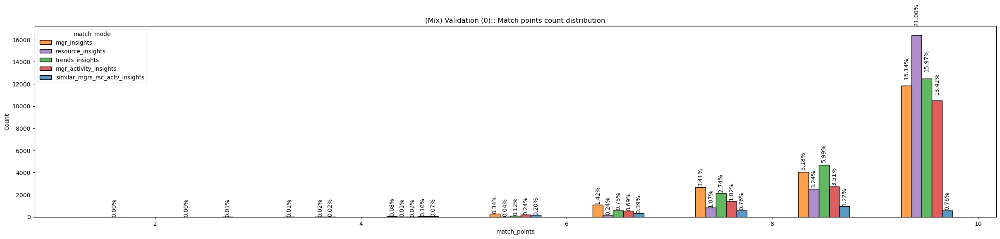

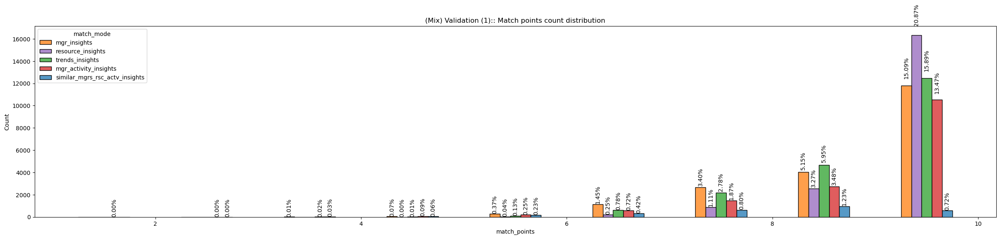

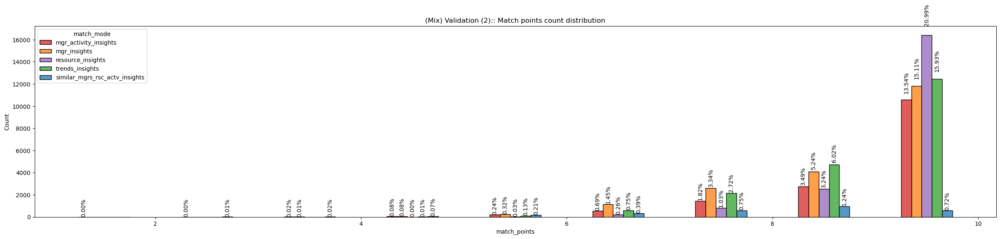

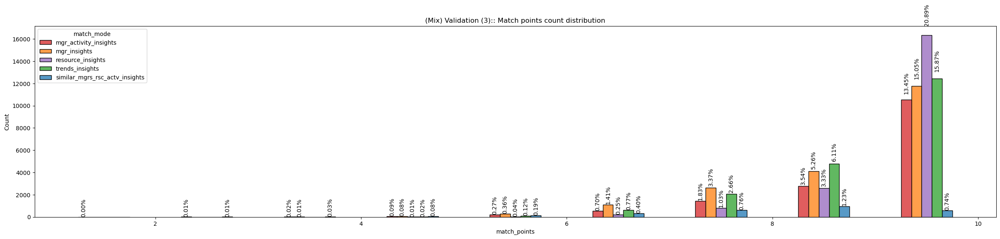

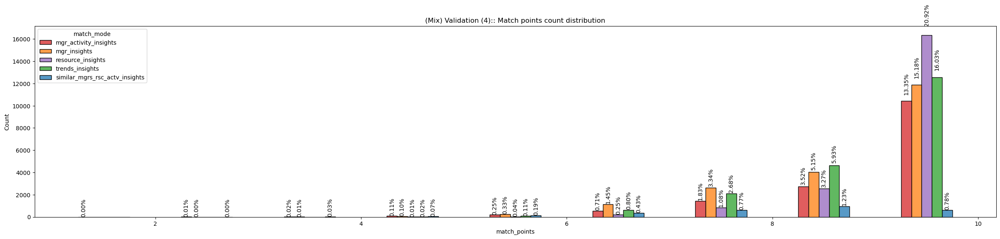

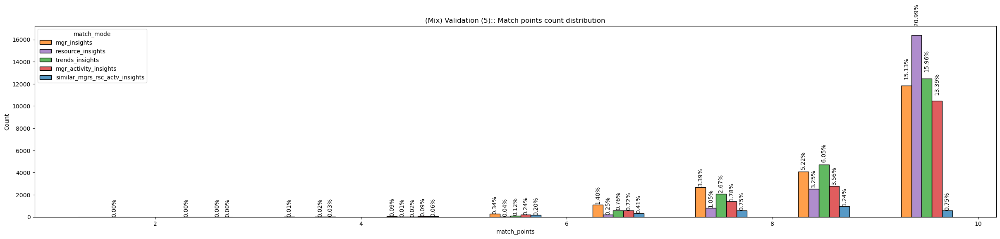

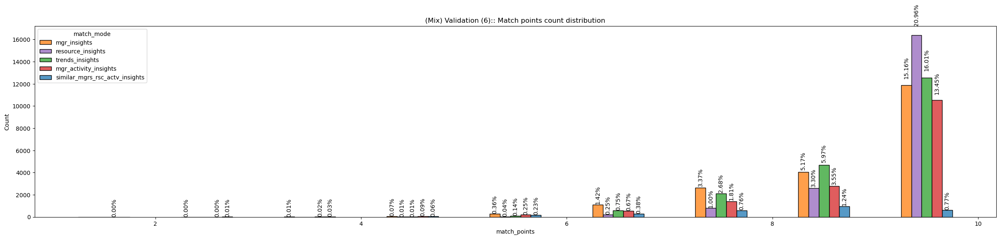

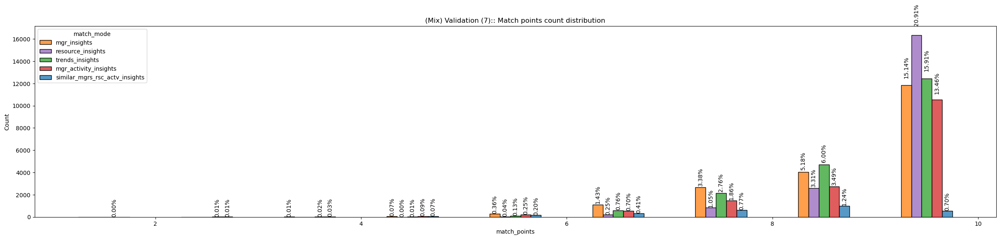

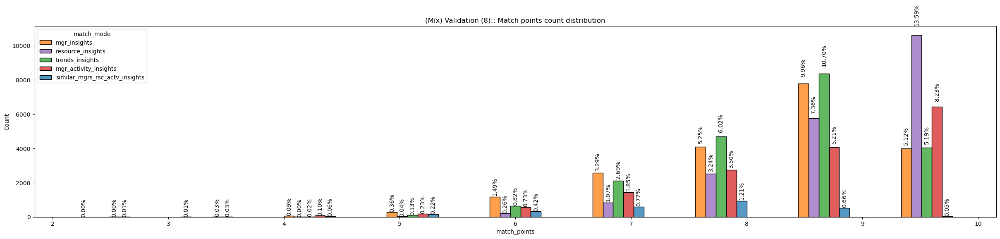

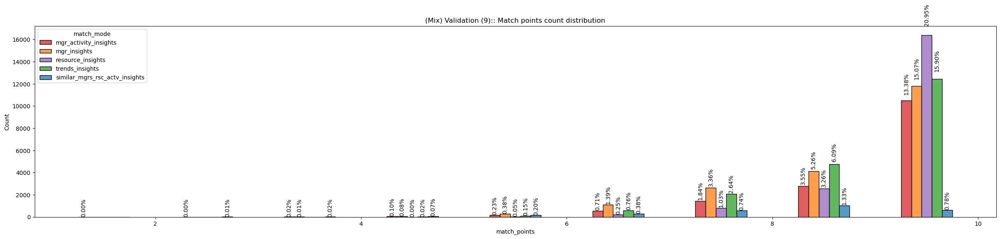

CPU times: user 15.9 s, sys: 7.33 s, total: 23.2 s
Wall time: 16.8 s


In [665]:
%%time
i = 0
validation_results_mix_pool = []
for i in range (0, 10):
    
    validation_results_mix_df= pd.read_parquet(f'./abac_research_outputs/model/validation_results_mix_{i}_df.parquet', engine='pyarrow')
    
    validation_results_mix_pool.append(validation_results_mix_df)
    _=plot_match_points_count_distribution(validation_results_mix_df, f'(Mix) Validation ({i}):: Match points count distribution')

    i += 1

del i

### Initialize indicators

In [666]:
indicators_array = []
for i in range(0, 10):
    indicators_array.append({
        'decied_indices':[],
        'approved_indices':[],
        'exclude_ambiguation':[]
    })

### Base Status

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 0 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 1 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 2 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 3 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 4 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 5 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 6 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 7 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 8 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 9 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

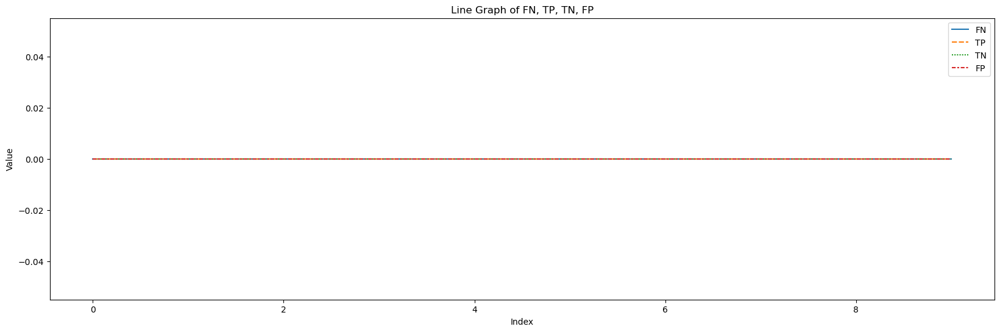

In [667]:
i = 0
matrix_entries = []
for _x_validation in _x_validation_pool:
    pprint('*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ {0} ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*'.format(i))
    _, matrix_entry = plot_status(_df= _x_validation, curr_decied_indices = decied_indices,
                    curr_approved_indices = approved_indices,
                    curr_exclude_ambiguation=exclude_ambiguation)
    matrix_entries.append(matrix_entry)
    
    i += 1
    pprint('\n')

del i
del _x_validation

plot_fn_tp_tn_fp_graph(matrix_entries)
del matrix_entries

### Ambiguation

In [668]:
def ambiguation_match(__x_train, __x_validation, is_validation = True):
    join_cols_cross = ['prj_led', 'admin_roles', 'isEmployee', 'type', 'rsc_prj',
                       'rsc_department', 'proprietary', 'task', 'activity', 
                       'user_task_corr', 'user_prj_corr', 'user_department_corr', 'expertise']

    df_inner = pd.merge(__x_train, __x_validation.reset_index(), on=join_cols_cross, how='inner').drop_duplicates()
    
    if is_validation:
        pprint(f"Train & Validation cross data size: {len(df_inner):,}")
    else:
        pprint(f"Train & Test cross data size: {len(df_inner):,}")


    df_inner = df_inner.rename(columns={'action_x':'action_train', 'action_y':'action_test'})

    df_inner_agg = df_inner[['index', 'action_train','action_test']].groupby(['index']).agg(
        DisambiguationCount=('action_train', 'count'),
        AR = ('action_train', 'mean'),).\
    reset_index().sort_values(by=['DisambiguationCount'], ascending=False)
    df_inner_agg['Disambiguation'] = df_inner_agg['DisambiguationCount'].apply(lambda x: x>1)

    df_inner_exact = df_inner_agg.query(f'Disambiguation == True')
    exclude_indices = list(df_inner_exact['index'])
    if is_validation:
        pprint(f"Train & Validation cross data size with more than a single entry: {len(exclude_indices):,}")
    else:
        pprint(f"Train & Test cross data size with more than a single entry: {len(exclude_indices):,}")

    return exclude_indices

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 0 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,101

Train & Validation cross data size with more than a single entry: 18

ambiguation entries: [84355, 183096, 146122, 146143, 980, 178978, 71481, 9731, 147974, 32678, 35237, 72387, 21843, 
3977, 125372, 31868, 191592, 121924]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 1 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,022

Train & Validation cross data size with more than a single entry: 17

ambiguation entries: [101515, 147974, 99292, 127285, 167196, 19837, 183096, 3977, 9731, 35237, 980, 125372, 82114, 
71481, 119711, 134280, 21843]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 2 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,023

Train & Validation cross data size with more than a single entry: 21

ambiguation entries: [3977, 100745, 19529, 127285, 178978, 21843, 101515, 31868, 82114, 71481, 99292, 121924, 
84355, 72387, 35237, 134280, 146122, 79072, 980, 148984, 191592]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 3 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,006

Train & Validation cross data size with more than a single entry: 10

ambiguation entries: [121924, 71481, 72387, 134280, 157527, 90397, 21843, 147974, 125372, 19837]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 4 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,085

Train & Validation cross data size with more than a single entry: 12

ambiguation entries: [183096, 125372, 157527, 980, 82114, 148984, 99292, 19529, 100745, 121924, 101515, 32678]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 5 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,065

Train & Validation cross data size with more than a single entry: 14

ambiguation entries: [183096, 167196, 980, 90397, 157527, 125372, 99292, 31868, 10144, 119711, 71481, 121924, 
147974, 72387]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 6 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,050

Train & Validation cross data size with more than a single entry: 17

ambiguation entries: [146122, 99292, 35237, 101515, 125372, 9731, 31868, 183096, 127285, 84355, 119711, 148984, 
79072, 121924, 90397, 2563, 100745]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 7 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,011

Train & Validation cross data size with more than a single entry: 17

ambiguation entries: [82114, 119711, 167196, 980, 134280, 35237, 71481, 101515, 100745, 19529, 10144, 148984, 3977,
183096, 19837, 2563, 72387]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 8 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,040

Train & Validation cross data size with more than a single entry: 14

ambiguation entries: [125372, 2563, 35237, 167196, 134280, 127285, 99292, 32678, 191592, 19529, 84355, 10144, 
90397, 100745]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 9 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,046

Train & Validation cross data size with more than a single entry: 18

ambiguation entries: [183096, 21843, 84355, 3977, 127285, 90397, 147974, 32678, 157527, 99292, 31868, 980, 82114, 
191592, 100745, 71481, 9731, 146122]

Remain Allow:: 19051 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 949 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

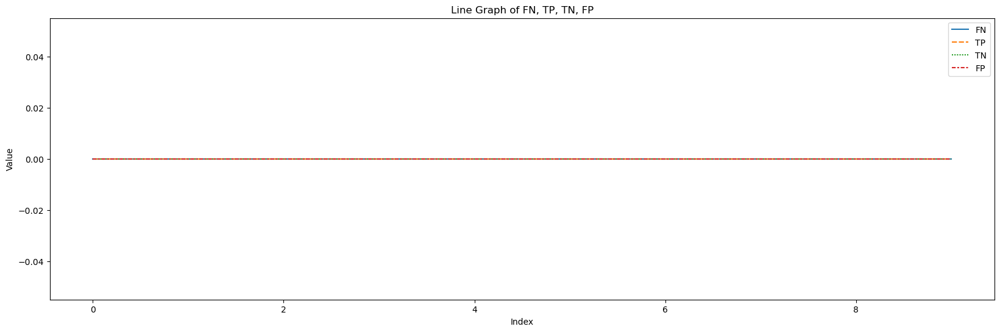

In [669]:
i = 0
matrix_entries = []
for _x_validation in _x_validation_pool:
    pprint('*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ {0} ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*'.format(i))
    exclude_ambiguation_indices = ambiguation_match(__x_train = _x_train, __x_validation = _x_validation)
    
    pprint(f'ambiguation entries: {exclude_ambiguation_indices}\n')
    
    _, matrix_entry = plot_status(_df= _x_validation, curr_decied_indices = decied_indices,
                            curr_approved_indices = approved_indices,
                            curr_exclude_ambiguation=exclude_ambiguation)
    matrix_entries.append(matrix_entry)
    
    i += 1
    pprint('\n')

del i
del _x_validation

plot_fn_tp_tn_fp_graph(matrix_entries)
del matrix_entries

### Found Full Match

In [670]:
def validation1_exclude_found_full_match(__x_train, __x_validation, exclude_ambiguation):
    join_cols_cross = ['prj_led', 'admin_roles', 'isEmployee', 'type', 'rsc_prj',
                       'rsc_department', 'proprietary', 'task', 'activity', 
                       'user_task_corr', 'user_prj_corr', 'user_department_corr', 'expertise']

    df_inner = pd.merge(__x_train, __x_validation.reset_index(), on=join_cols_cross, how='inner').drop_duplicates()
    pprint(f"Train & Validation cross data size: {len(df_inner):,}")

    df_inner = df_inner.rename(columns={'action_x':'action_train', 'action_y':'action_test'})

    df_inner_agg = df_inner[['index', 'action_train','action_test']].groupby(['index']).agg(
        DisambiguationCount=('action_train', 'count'),
        AR = ('action_train', 'mean'),).\
        reset_index().sort_values(by=['DisambiguationCount'], ascending=False)

    # Everything below 1.0 will be denied
    df_inner_exact_deny = df_inner_agg.query(f'AR < 1.0')
    # All remaining entries which are equal to 1.0, will be allowed
    df_inner_exact_allow = df_inner_agg.query(f'AR == 1.0')

    exclude_indices_deny = list(df_inner_exact_deny['index'])
    exclude_indices_allow = list(df_inner_exact_allow['index'])
    pprint(f"exclude_indices_deny: {len(exclude_indices_deny):,}")
    pprint(f"exclude_indices_allow: {len(exclude_indices_allow):,}")
    # pprint(f"*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-\n")
    return exclude_indices_deny, exclude_indices_allow

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 0 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,101

exclude_indices_deny: 35

exclude_indices_allow: 4,048

Remain Allow:: 14985 (78.657%)             False-Negative: 0.173%, True-Positive: 21.169%             (PTLTL 
:99.827%), AMB: 0.000%

Remain Deny :: 930 (97.998%)         True-Negative: 0.211%, False-Positive: 1.791%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 1 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,022

exclude_indices_deny: 32

exclude_indices_allow: 3,973

Remain Allow:: 15068 (79.093%)             False-Negative: 0.157%, True-Positive: 20.750%             (PTLTL 
:99.843%), AMB: 0.000%

Remain Deny :: 925 (97.471%)         True-Negative: 0.211%, False-Positive: 2.318%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 2 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,023

exclude_indices_deny: 33

exclude_indices_allow: 3,969

Remain Allow:: 15068 (79.093%)             False-Negative: 0.168%, True-Positive: 20.739%             (PTLTL 
:99.832%), AMB: 0.000%

Remain Deny :: 926 (97.576%)         True-Negative: 0.105%, False-Positive: 2.318%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 3 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,006

exclude_indices_deny: 26

exclude_indices_allow: 3,970

Remain Allow:: 15071 (79.109%)             False-Negative: 0.131%, True-Positive: 20.760%             (PTLTL 
:99.869%), AMB: 0.000%

Remain Deny :: 932 (98.209%)         True-Negative: 0.105%, False-Positive: 1.686%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 4 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,085

exclude_indices_deny: 23

exclude_indices_allow: 4,050

Remain Allow:: 14999 (78.731%)             False-Negative: 0.110%, True-Positive: 21.159%             (PTLTL 
:99.890%), AMB: 0.000%

Remain Deny :: 926 (97.576%)         True-Negative: 0.211%, False-Positive: 2.213%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 5 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,065

exclude_indices_deny: 31

exclude_indices_allow: 4,020

Remain Allow:: 15027 (78.878%)             False-Negative: 0.157%, True-Positive: 20.965%             (PTLTL 
:99.843%), AMB: 0.000%

Remain Deny :: 920 (96.944%)         True-Negative: 0.105%, False-Positive: 2.950%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 6 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,050

exclude_indices_deny: 28

exclude_indices_allow: 4,005

Remain Allow:: 15038 (78.935%)             False-Negative: 0.142%, True-Positive: 20.923%             (PTLTL 
:99.858%), AMB: 0.000%

Remain Deny :: 927 (97.682%)         True-Negative: 0.105%, False-Positive: 2.213%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 7 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,011

exclude_indices_deny: 30

exclude_indices_allow: 3,964

Remain Allow:: 15073 (79.119%)             False-Negative: 0.152%, True-Positive: 20.729%             (PTLTL 
:99.848%), AMB: 0.000%

Remain Deny :: 933 (98.314%)         True-Negative: 0.105%, False-Positive: 1.581%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 8 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,040

exclude_indices_deny: 28

exclude_indices_allow: 3,998

Remain Allow:: 15037 (78.930%)             False-Negative: 0.136%, True-Positive: 20.933%             (PTLTL 
:99.864%), AMB: 0.000%

Remain Deny :: 936 (98.630%)         True-Negative: 0.211%, False-Positive: 1.159%, AMB: 0.000%

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 9 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Train & Validation cross data size: 4,046

exclude_indices_deny: 32

exclude_indices_allow: 3,996

Remain Allow:: 15038 (78.935%)             False-Negative: 0.168%, True-Positive: 20.897%             (PTLTL 
:99.832%), AMB: 0.000%

Remain Deny :: 932 (98.209%)         True-Negative: 0.000%, False-Positive: 1.791%, AMB: 0.000%

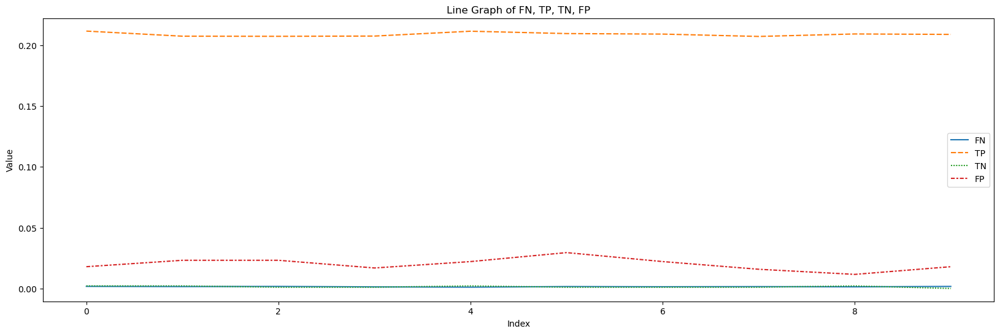

In [671]:
i = 0
matrix_entries = []
for _x_validation in _x_validation_pool:
    pprint('*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ {0} ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*'.format(i))
    validation1_exclude_indices_deny, validation1_exclude_indices_allow = \
        validation1_exclude_found_full_match(__x_train = _x_train, __x_validation = _x_validation,
                                             exclude_ambiguation = exclude_ambiguation)
    
    _, matrix_entry = plot_status(_df= _x_validation, 
                    curr_decied_indices=(validation1_exclude_indices_deny),
                    curr_approved_indices=(validation1_exclude_indices_allow), 
                    curr_exclude_ambiguation=exclude_ambiguation,
                                  show_plot = True)
    indicators_array[i]={
        'decied_indices':validation1_exclude_indices_deny,
        'approved_indices':validation1_exclude_indices_allow,
        'exclude_ambiguation':exclude_ambiguation
    }
    matrix_entries.append(matrix_entry)
    
    i += 1
    pprint('\n')

del i
del _x_validation

plot_fn_tp_tn_fp_graph(matrix_entries)
del matrix_entries

In [713]:
def find_ar_lim(_df):
    def generate_numbers(n):
        """
        Generates a list of numbers from 1 to n.
    
        Args:
        n (int): A positive integer.
    
        Returns:
        list: A list of integers from 1 to n.
        """
        if n < 1:
            raise ValueError("The number must be a positive integer.")
        
        return list(range(1, n + 1))
    result = _df.sort_values(by=['fn_exceeded', 'TN', 'specificity', 'f1score', 'match_point'], 
                                     ascending=[True, False, False, False, False]) \
                                    .groupby('i', as_index=False) \
                                    .first()
    display(result)
    
    # Group by 'ar_lim' and count the number of rows in each group
    grouped = result.groupby(['ar_lim', 'match_point']).size().reset_index(name='count')
    
    # Find the 'ar_lim' value with the highest count
    max_count_row = grouped.loc[grouped['count'].idxmax()]
    # Extract the 'ar_lim' value with the highest count
    lim_mgr = max_count_row['ar_lim']
    match_point = max_count_row['match_point']
    
    # Display the result
    print(f"ar_lim: {lim_mgr}, match_point: {generate_numbers(int(match_point))}")
    return lim_mgr, generate_numbers(int(match_point))

In [673]:
def generate_ar_lim_range(num):
    """
    Generates a range of values around lim_sim_mgr_1, ensuring values are between 0 and 1.

    Args:
    lim_sim_mgr_1 (float): The central value for generating the range.

    Returns:
    numpy.ndarray: An array of values within the range [0, 1].
    """
    # Calculate the start and stop ensuring they stay within [0, 1]
    start = max(num - 0.05, 0)
    stop = min(num + 0.06, 1)

    # Generate the range
    ar_lim_range = np.arange(start, stop, 0.01)
    
    return ar_lim_range

In [674]:
def lineup_dataframe(match_mode = ["mgr_insights"], match_points_count = [1], ar_lims = [0.9], plot_graph = False):
    i=0
    for _x_validation in _x_validation_pool:
    
        pprint('*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ {0} ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*'.format(i))
        validation_results_mix_df = validation_results_mix_pool[i].copy()        
        ex_lst = list(set(indicators_array[i]['decied_indices'] + indicators_array[i]['approved_indices'] + indicators_array[i]['exclude_ambiguation']))
    
        for ar_lim in ar_lims:
            
            _indices_deny = list(set(indicators_array[i]['decied_indices']))
            prev_specificity = None

            j = len(match_points_count)
            for match_point in match_points_count:

                j -= 1
                show_plot = (j ==0)
                counts_allow_arr = validation_results_mix_df.query(f'ind not in {ex_lst}').\
                    query(f'match_points_count in {[match_point]}').\
                    query(f'ar < {ar_lim}').query(f'match_mode in {match_mode} ').\
                    query('action == True')[['ind']].drop_duplicates()[['ind']]
                
                counts_deny_arr = validation_results_mix_df.query(f'ind not in {ex_lst}').\
                    query(f'match_points_count in {[match_point]}').\
                    query(f'ar < {ar_lim}').query(f'match_mode in {match_mode} ')[['ind']].drop_duplicates()[['ind']]
    
                counts_deny_arr = counts_deny_arr['ind'].to_list()
            
                _indices_deny = list(set(_indices_deny+counts_deny_arr))
            
                _, matrix_entry = plot_status(_df= _x_validation, 
                                              curr_decied_indices=_indices_deny,
                                              curr_approved_indices=indicators_array[i]['approved_indices'], 
                                              curr_exclude_ambiguation=indicators_array[i]['exclude_ambiguation'],
                                              show_plot = show_plot)
    
                existing_decied_indices = list(indicators_array[i]['decied_indices'])
                indicators_array[i]['decied_indices'] = list(set( existing_decied_indices + counts_deny_arr))
    
                if plot_graph and show_plot:
                    ex_lst = list(set(ex_lst + counts_deny_arr ))
        
                    test_results_mix_df_1 = validation_results_mix_df.copy().query(f'ind not in {ex_lst}')
        
                    _=plot_match_points_count_distribution(test_results_mix_df_1, 'Match points count distribution')
        
                    del test_results_mix_df_1
        i += 1
        pprint('\n')
    
    del i

In [675]:
def calc_mgr_th(fn_th = 0.1, match_points_count = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
                ar_lims = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
                match_mode = ["mgr_insights"]):

    i = 0
    matrix_entries = []
    with tqdm(total = ( len(_x_validation_pool) * len(ar_lims) * len(match_points_count) ) ) as pbar:
        
        for _x_validation in _x_validation_pool:
    
            validation_results_mix_df = validation_results_mix_pool[i].copy()        
            ex_lst = list(set(indicators_array[i]['decied_indices'] + indicators_array[i]['approved_indices'] + indicators_array[i]['exclude_ambiguation']))
    
            for ar_lim in ar_lims:
                
                _indices_deny = list(set(indicators_array[i]['decied_indices']))
                prev_specificity = None
                
                for match_point in match_points_count:
    
                    counts_allow_arr = validation_results_mix_df.query(f'ind not in {ex_lst}').\
                        query(f'match_points_count in {[match_point]}').\
                        query(f'ar < {ar_lim}').query(f'match_mode in {match_mode} ').\
                        query('action == True')[['ind']].drop_duplicates()[['ind']]
                    
                    counts_deny_arr = validation_results_mix_df.query(f'ind not in {ex_lst}').\
                        query(f'match_points_count in {[match_point]}').\
                        query(f'ar < {ar_lim}').query(f'match_mode in {match_mode} ')[['ind']].drop_duplicates()[['ind']]
    
                    counts_deny_arr = counts_deny_arr['ind'].to_list()
                
                    _indices_deny = list(set(_indices_deny+counts_deny_arr))
                
                    _, matrix_entry = plot_status(_df= _x_validation, 
                                                  curr_decied_indices=_indices_deny,
                                                  curr_approved_indices=indicators_array[i]['approved_indices'], 
                                                  curr_exclude_ambiguation=indicators_array[i]['exclude_ambiguation'],
                                                  show_plot = False)
    
                    
                    specificity, f1score, cf = calc_specificity(_x_validation, _indices_deny)
                
                
                    if prev_specificity is None:
                        prev_specificity = specificity
            
                    fn_exceeded = fn_th <= matrix_entry['FN']
                    matrix_entry_ex = copy.deepcopy(matrix_entry)
                    matrix_entry_ex['i'] = i
                    matrix_entry_ex['ar_lim'] = ar_lim
                    matrix_entry_ex['match_point'] = match_point
                    matrix_entry_ex['specificity'] = specificity
                    matrix_entry_ex['f1score'] = f1score
                    matrix_entry_ex['fn_exceeded'] = fn_exceeded
            
                    if fn_exceeded:
                        # pprint(matrix_entry_ex)
                        break
                    else:
                        matrix_entries.append(matrix_entry_ex)
                        
                    pbar.update(1)
                    
            i += 1
    
    return pd.DataFrame(matrix_entries)

### Identify Manager-Insight Indicators

#### Identify Manager-Insight Indicators - level 1

Max False-Negative will not exceed 15%

In [676]:
%%time
mgr_th_1_df = calc_mgr_th(fn_th = 0.15)

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 770/1100 [11:16<04:49,  1.14it/s]

CPU times: user 8min 30s, sys: 2min, total: 10min 31s
Wall time: 11min 16s


In [677]:
ar_lim_mgr_1, mgr_match_point_1 = find_ar_lim(mgr_th_1_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.144769,0.211695,0.726027,0.017914,0.9,1,0.03445,0.600018,False
1,1,0.143352,0.207496,0.735511,0.023182,0.9,1,0.03490,0.600671,False
2,2,0.145189,0.207391,0.699684,0.023182,0.9,1,0.03320,0.599906,False
3,3,0.146869,0.207601,0.714436,0.016860,0.9,1,0.03390,0.599043,False
4,4,0.147079,0.211590,0.720759,0.022129,0.9,1,0.03420,0.598919,False
5,5,0.146764,0.209648,0.715490,0.029505,0.9,1,0.03395,0.599090,False
6,6,0.147341,0.209228,0.713383,0.022129,0.9,1,0.03385,0.598818,False
7,7,0.144192,0.207286,0.733404,0.015806,0.9,1,0.03480,0.600272,False
8,8,0.145819,0.209333,0.726027,0.011591,0.9,1,0.03445,0.599510,False
9,9,0.148286,0.208965,0.711275,0.017914,0.9,1,0.03375,0.598368,False


ar_lim: 0.9, match_point: [1]


In [678]:
ar_lim_mgr_range = generate_ar_lim_range(ar_lim_mgr_1)
ar_lim_mgr_range

array([0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95])

#### Identify Manager-Insight Indicators - level 2

Max False-Negative will not exceed 15%, with an accurate ar_lim range to look in

In [679]:
%%time
mgr_th_2_df = calc_mgr_th(fn_th = 0.15, match_mode=['mgr_insights'], 
                              ar_lims = ar_lim_mgr_range)

  5%|█████████▌                                                                                                                                                                     | 60/1100 [02:28<42:52,  2.47s/it]

CPU times: user 1min 55s, sys: 24.9 s, total: 2min 20s
Wall time: 2min 28s


In [680]:
ar_lim_mgr_2, mgr_match_point_2 = find_ar_lim(mgr_th_2_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.144769,0.211695,0.726027,0.017914,0.90,1,0.03445,0.600018,False
1,1,0.140833,0.207496,0.735511,0.023182,0.89,1,0.03490,0.601887,False
2,2,0.145189,0.207391,0.699684,0.023182,0.90,1,0.03320,0.599906,False
3,3,0.146869,0.207601,0.714436,0.016860,0.90,1,0.03390,0.599043,False
4,4,0.147079,0.211590,0.720759,0.022129,0.90,1,0.03420,0.598919,False
5,5,0.146764,0.209648,0.715490,0.029505,0.90,1,0.03395,0.599090,False
6,6,0.147341,0.209228,0.713383,0.022129,0.90,1,0.03385,0.598818,False
7,7,0.144192,0.207286,0.733404,0.015806,0.90,1,0.03480,0.600272,False
8,8,0.145819,0.209333,0.726027,0.011591,0.90,1,0.03445,0.599510,False
9,9,0.145399,0.208965,0.711275,0.017914,0.89,1,0.03375,0.599765,False


ar_lim: 0.9, match_point: [1]


In [681]:
mgr_insights_match_mode = ["mgr_insights"]
mgr_insights_match_points = list(mgr_match_point_2)
mgr_insights_ar_lims = [ar_lim_mgr_2]

#### Identify Manager-Insight Indicators - Lineup validation Datasets


*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 0 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12260 (64.354%)             False-Negative: 14.477%, True-Positive: 21.169%             (PTLTL 
:85.523%), AMB: 0.000%

Remain Deny :: 243 (25.606%)         True-Negative: 72.603%, False-Positive: 1.791%, AMB: 0.000%

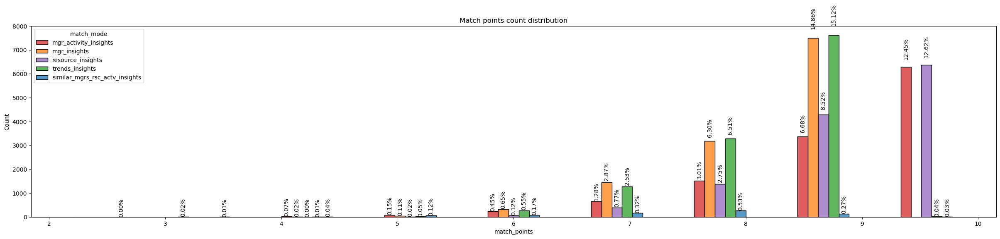

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 1 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12367 (64.915%)             False-Negative: 14.335%, True-Positive: 20.750%             (PTLTL 
:85.665%), AMB: 0.000%

Remain Deny :: 229 (24.131%)         True-Negative: 73.551%, False-Positive: 2.318%, AMB: 0.000%

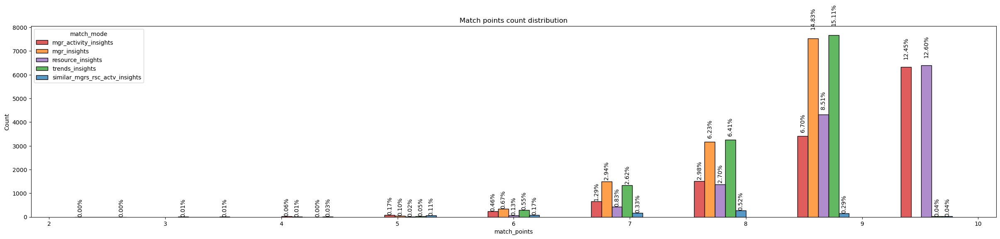

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 2 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12334 (64.742%)             False-Negative: 14.519%, True-Positive: 20.739%             (PTLTL 
:85.481%), AMB: 0.000%

Remain Deny :: 263 (27.713%)         True-Negative: 69.968%, False-Positive: 2.318%, AMB: 0.000%

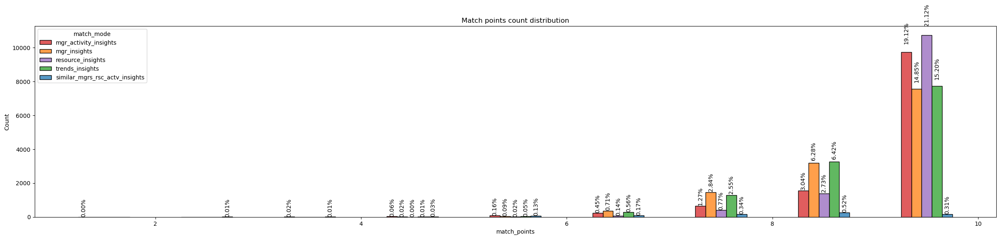

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 3 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12298 (64.553%)             False-Negative: 14.687%, True-Positive: 20.760%             (PTLTL 
:85.313%), AMB: 0.000%

Remain Deny :: 255 (26.870%)         True-Negative: 71.444%, False-Positive: 1.686%, AMB: 0.000%

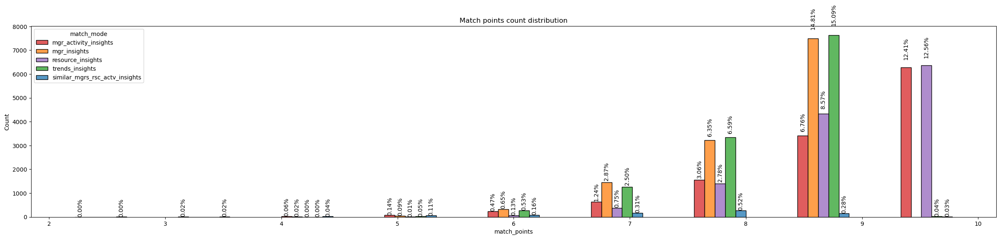

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 4 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12218 (64.133%)             False-Negative: 14.708%, True-Positive: 21.159%             (PTLTL 
:85.292%), AMB: 0.000%

Remain Deny :: 244 (25.711%)         True-Negative: 72.076%, False-Positive: 2.213%, AMB: 0.000%

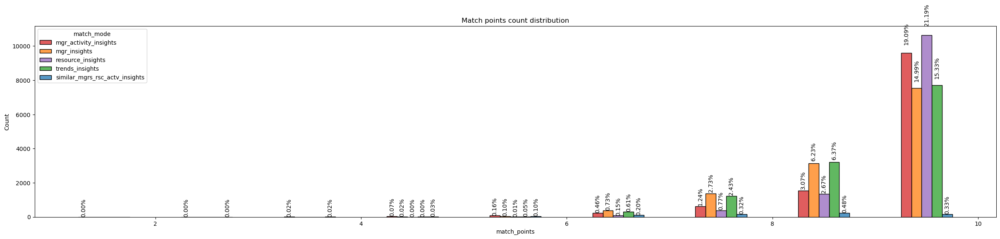

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 5 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12261 (64.359%)             False-Negative: 14.676%, True-Positive: 20.965%             (PTLTL 
:85.324%), AMB: 0.000%

Remain Deny :: 242 (25.501%)         True-Negative: 71.549%, False-Positive: 2.950%, AMB: 0.000%

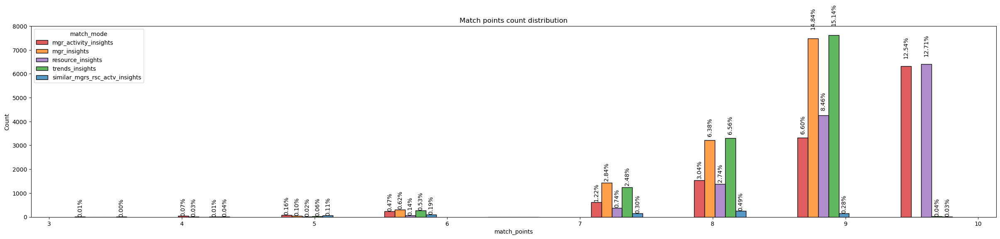

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 6 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12258 (64.343%)             False-Negative: 14.734%, True-Positive: 20.923%             (PTLTL 
:85.266%), AMB: 0.000%

Remain Deny :: 251 (26.449%)         True-Negative: 71.338%, False-Positive: 2.213%, AMB: 0.000%

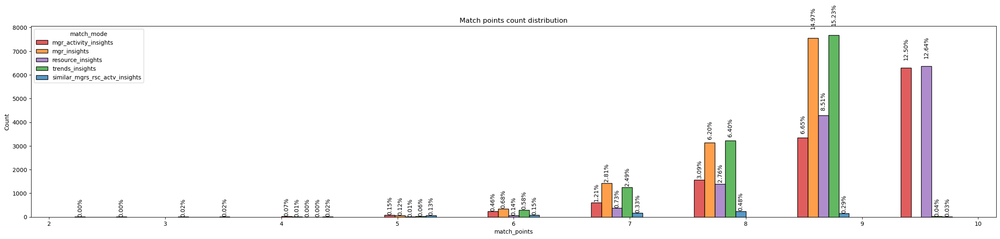

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 7 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12355 (64.852%)             False-Negative: 14.419%, True-Positive: 20.729%             (PTLTL 
:85.581%), AMB: 0.000%

Remain Deny :: 238 (25.079%)         True-Negative: 73.340%, False-Positive: 1.581%, AMB: 0.000%

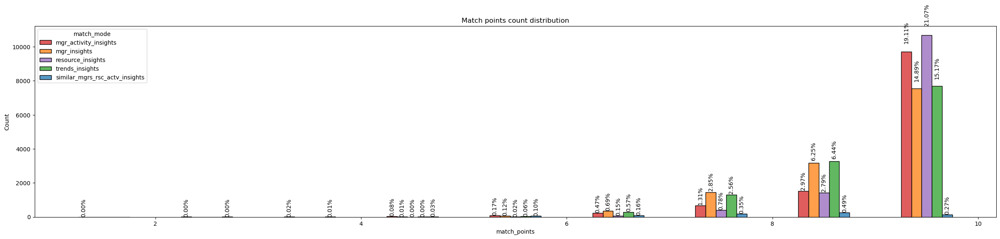

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 8 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12285 (64.485%)             False-Negative: 14.582%, True-Positive: 20.933%             (PTLTL 
:85.418%), AMB: 0.000%

Remain Deny :: 249 (26.238%)         True-Negative: 72.603%, False-Positive: 1.159%, AMB: 0.000%

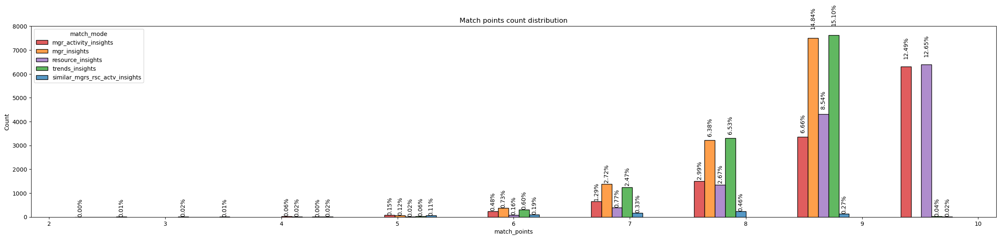

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 9 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12245 (64.275%)             False-Negative: 14.829%, True-Positive: 20.897%             (PTLTL 
:85.171%), AMB: 0.000%

Remain Deny :: 257 (27.081%)         True-Negative: 71.128%, False-Positive: 1.791%, AMB: 0.000%

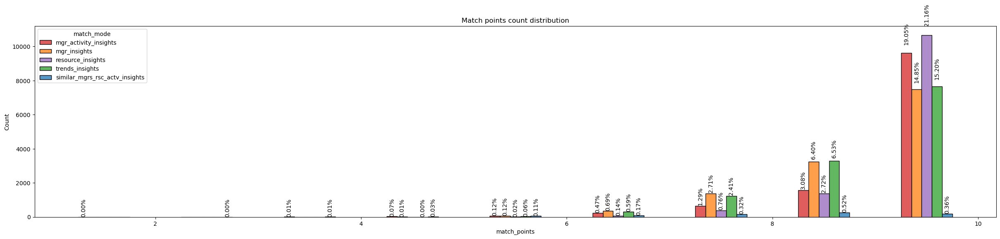

In [682]:
lineup_dataframe(match_mode = mgr_insights_match_mode, match_points_count = mgr_insights_match_points, 
                 ar_lims = mgr_insights_ar_lims, plot_graph = True)

### Identify Similar-Manager-Insight Indicators

#### Identify Similar-Manager-Insight Indicators - level 1

Max False-Negative will not exceed 20%

In [683]:
%%time
sim_mgr_th_1_df = calc_mgr_th(fn_th = 0.2, match_mode=['similar_mgrs_rsc_actv_insights'])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1100/1100 [19:17<00:00,  1.05s/it]

CPU times: user 11min 53s, sys: 2min 25s, total: 14min 18s
Wall time: 19min 17s


In [684]:
ar_lim_sim_mgr_1, sim_mgr_match_point_1 = find_ar_lim(sim_mgr_th_1_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.149546,0.211695,0.746048,0.017914,1.0,7,0.03540,0.597634,False
1,1,0.149336,0.207496,0.759747,0.023182,1.0,10,0.03605,0.597687,False
2,2,0.150753,0.207391,0.723920,0.023182,1.0,8,0.03435,0.597127,False
3,3,0.152800,0.207601,0.741834,0.016860,1.0,10,0.03520,0.596067,False
4,4,0.153115,0.211590,0.746048,0.022129,1.0,10,0.03540,0.595899,False
5,5,0.152066,0.209648,0.732350,0.029505,1.0,10,0.03475,0.596459,False
6,6,0.152328,0.209228,0.735511,0.022129,1.0,7,0.03490,0.596320,False
7,7,0.149546,0.207286,0.758693,0.015806,1.0,8,0.03600,0.597589,False
8,8,0.151121,0.209333,0.747102,0.011591,1.0,7,0.03545,0.596865,False
9,9,0.154113,0.208965,0.738672,0.017914,1.0,7,0.03505,0.595440,False


ar_lim: 1.0, match_point: [1, 2, 3, 4, 5, 6, 7]


In [685]:
ar_lim_sim_mgr_range = generate_ar_lim_range(ar_lim_sim_mgr_1)
ar_lim_sim_mgr_range

array([0.95, 0.96, 0.97, 0.98, 0.99, 1.  ])

#### Identify Similar-Manager-Insight Indicators- level 2

Max False-Negative will not exceed 20%, with an accurate ar_lim range to look in

In [686]:
%%time
sim_mgr_th_2_df = calc_mgr_th(fn_th = 0.2, match_mode=['similar_mgrs_rsc_actv_insights'], 
                              ar_lims = ar_lim_sim_mgr_range)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [07:58<00:00,  1.25it/s]

CPU times: user 6min 28s, sys: 1min 11s, total: 7min 39s
Wall time: 7min 58s


In [687]:
ar_lim_sim_mgr_2, sim_mgr_match_point_2 = find_ar_lim(sim_mgr_th_2_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.149493,0.211695,0.746048,0.017914,0.96,7,0.03540,0.597659,False
1,1,0.149231,0.207496,0.759747,0.023182,0.95,10,0.03605,0.597738,False
2,2,0.150701,0.207391,0.723920,0.023182,0.96,8,0.03435,0.597153,False
3,3,0.152590,0.207601,0.741834,0.016860,0.95,10,0.03520,0.596170,False
4,4,0.153010,0.211590,0.746048,0.022129,0.96,10,0.03540,0.595950,False
5,5,0.152013,0.209648,0.732350,0.029505,0.96,10,0.03475,0.596485,False
6,6,0.152275,0.209228,0.735511,0.022129,0.96,7,0.03490,0.596346,False
7,7,0.149388,0.207286,0.758693,0.015806,0.95,8,0.03600,0.597665,False
8,8,0.150963,0.209333,0.747102,0.011591,0.95,7,0.03545,0.596942,False
9,9,0.154060,0.208965,0.738672,0.017914,0.96,7,0.03505,0.595466,False


ar_lim: 0.96, match_point: [1, 2, 3, 4, 5, 6, 7]


In [688]:
sim_mgr_insights_match_mode = ["similar_mgrs_rsc_actv_insights"]
sim_mgr_insights_match_points = list(sim_mgr_match_point_2)
sim_mgr_insights_ar_lims = [ar_lim_sim_mgr_2]

#### Identify Similar-Manager-Insight Indicators - Lineup validation Datasets


*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 0 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12170 (63.881%)             False-Negative: 14.949%, True-Positive: 21.169%             (PTLTL 
:85.051%), AMB: 0.000%

Remain Deny :: 224 (23.604%)         True-Negative: 74.605%, False-Positive: 1.791%, AMB: 0.000%

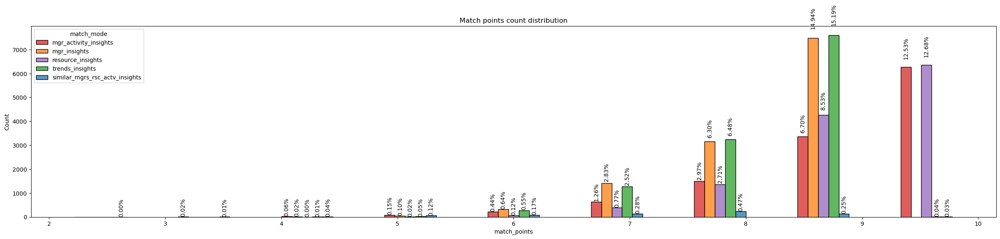

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 1 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12268 (64.396%)             False-Negative: 14.855%, True-Positive: 20.750%             (PTLTL 
:85.145%), AMB: 0.000%

Remain Deny :: 207 (21.812%)         True-Negative: 75.869%, False-Positive: 2.318%, AMB: 0.000%

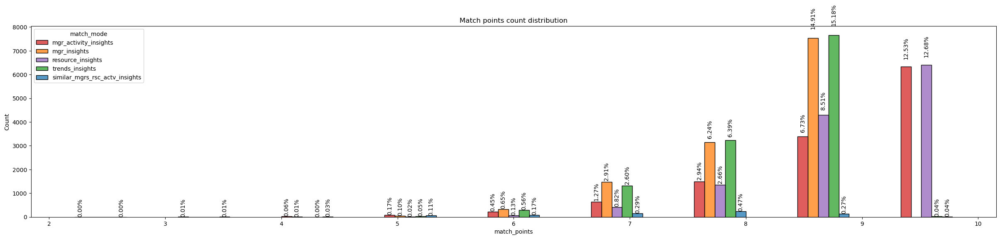

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 2 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12243 (64.264%)             False-Negative: 14.997%, True-Positive: 20.739%             (PTLTL 
:85.003%), AMB: 0.000%

Remain Deny :: 241 (25.395%)         True-Negative: 72.287%, False-Positive: 2.318%, AMB: 0.000%

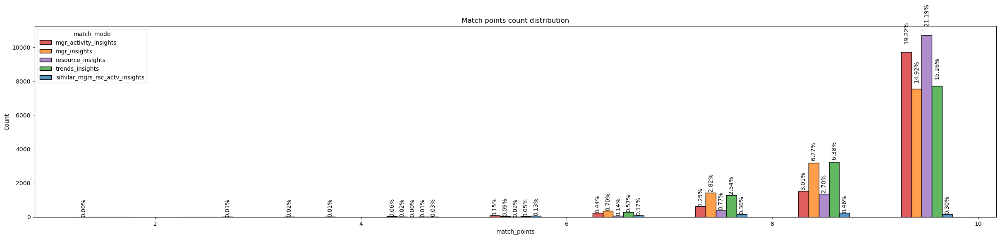

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 3 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12198 (64.028%)             False-Negative: 15.212%, True-Positive: 20.760%             (PTLTL 
:84.788%), AMB: 0.000%

Remain Deny :: 230 (24.236%)         True-Negative: 74.078%, False-Positive: 1.686%, AMB: 0.000%

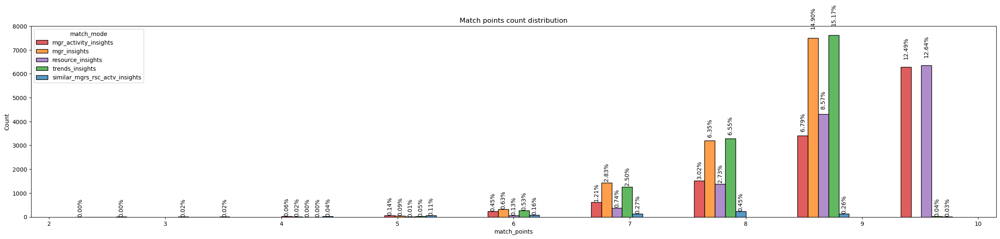

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 4 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12115 (63.592%)             False-Negative: 15.249%, True-Positive: 21.159%             (PTLTL 
:84.751%), AMB: 0.000%

Remain Deny :: 221 (23.288%)         True-Negative: 74.499%, False-Positive: 2.213%, AMB: 0.000%

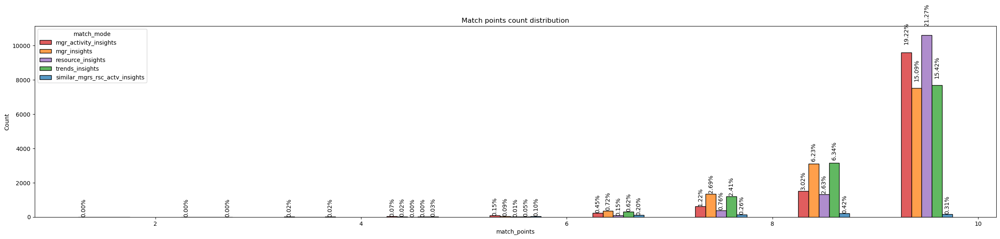

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 5 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12172 (63.892%)             False-Negative: 15.144%, True-Positive: 20.965%             (PTLTL 
:84.856%), AMB: 0.000%

Remain Deny :: 228 (24.025%)         True-Negative: 73.024%, False-Positive: 2.950%, AMB: 0.000%

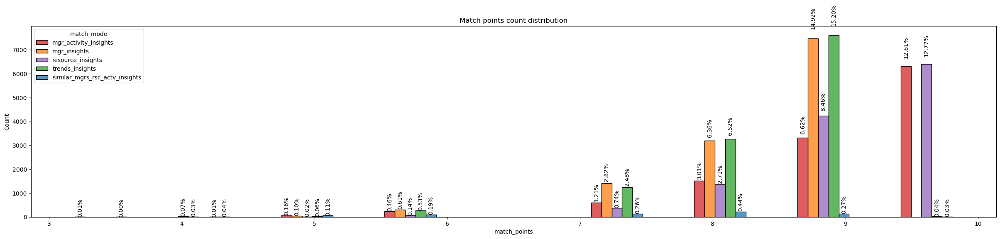

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 6 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12164 (63.850%)             False-Negative: 15.228%, True-Positive: 20.923%             (PTLTL 
:84.772%), AMB: 0.000%

Remain Deny :: 230 (24.236%)         True-Negative: 73.551%, False-Positive: 2.213%, AMB: 0.000%

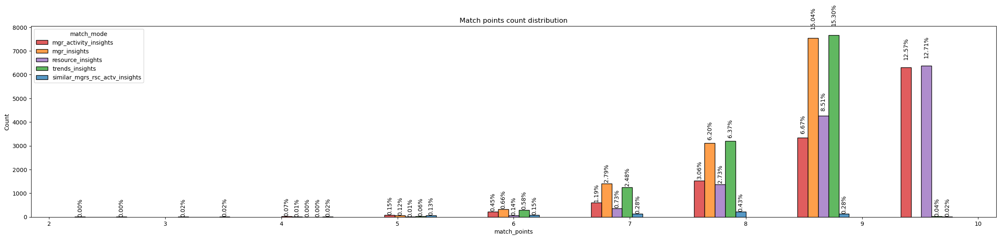

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 7 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12262 (64.364%)             False-Negative: 14.907%, True-Positive: 20.729%             (PTLTL 
:85.093%), AMB: 0.000%

Remain Deny :: 216 (22.761%)         True-Negative: 75.659%, False-Positive: 1.581%, AMB: 0.000%

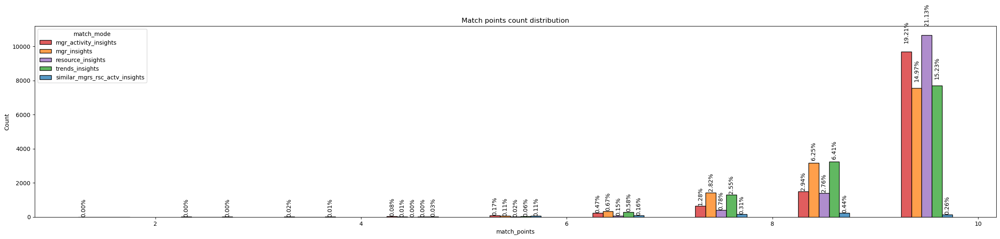

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 8 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12185 (63.960%)             False-Negative: 15.107%, True-Positive: 20.933%             (PTLTL 
:84.893%), AMB: 0.000%

Remain Deny :: 229 (24.131%)         True-Negative: 74.710%, False-Positive: 1.159%, AMB: 0.000%

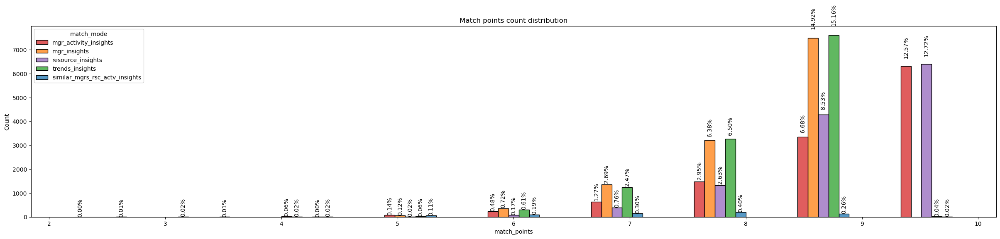

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 9 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 12135 (63.697%)             False-Negative: 15.406%, True-Positive: 20.897%             (PTLTL 
:84.594%), AMB: 0.000%

Remain Deny :: 231 (24.341%)         True-Negative: 73.867%, False-Positive: 1.791%, AMB: 0.000%

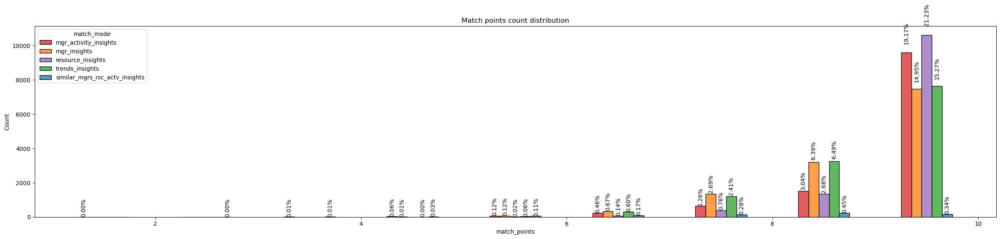

In [689]:
lineup_dataframe(match_mode = sim_mgr_insights_match_mode, 
                 match_points_count = sim_mgr_insights_match_points, 
                 ar_lims = sim_mgr_insights_ar_lims, plot_graph = True)

In [735]:
### Identify Manager-Activity-Insights Indicators

In [737]:
#### Identify Manager-Activity-Insights Indicators - level 1

# Max False-Negative will not exceed 20%

In [738]:
# %%time
# actv_mgr_th_1_df = calc_mgr_th(fn_th = 0.2, match_mode=['mgr_activity_insights'])

In [739]:
# ar_lim_actv_mgr_1, actv_mgr_match_point_1 = find_ar_lim(actv_mgr_th_1_df)

In [740]:
# ar_lim_actv_mgr_range = generate_ar_lim_range(ar_lim_actv_mgr_1)
# ar_lim_actv_mgr_range

In [741]:
#### Identify Manager-Activity-Insights Indicators - level 2

# Max False-Negative will not exceed 20%, with an accurate ar_lim range to look in

In [742]:
# %%time
# actv_mgr_th_2_df = calc_mgr_th(fn_th = 0.2, match_mode=['mgr_activity_insights'], 
#                               ar_lims = ar_lim_actv_mgr_range)

In [743]:
# ar_lim_actv_mgr_2, actv_mgr_match_point_2 = find_ar_lim(actv_mgr_th_2_df)

In [747]:
# actv_mgr_insights_match_mode = ["mgr_activity_insights"]
# actv_mgr_insights_match_points = list(actv_mgr_match_point_2)
# actv_mgr_insights_ar_lims = [ar_lim_actv_mgr_2]

In [748]:
#### Identify Manager-Activity-Insights Indicators - Lineup validation Datasets


In [749]:
# lineup_dataframe(match_mode = actv_mgr_insights_match_mode, 
#                  match_points_count = actv_mgr_insights_match_points, 
#                  ar_lims = actv_mgr_insights_ar_lims, plot_graph = True)

### Identify Trends-Insights Indicators

#### Identify Trends-Insights Indicators - level 1

Max False-Negative will not exceed 25%

In [690]:
%%time
trnd_th_1_df = calc_mgr_th(fn_th = 0.2, match_mode=['trends_insights'])

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 739/1100 [11:06<05:25,  1.11it/s]

CPU times: user 8min 40s, sys: 1min 35s, total: 10min 15s
Wall time: 11min 6s


In [691]:
ar_lim_trnd_1, trnd_match_point_1 = find_ar_lim(trnd_th_1_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.191643,0.211695,0.817703,0.017914,0.7,4,0.03880,0.576554,False
1,1,0.192168,0.207496,0.819810,0.023182,0.8,3,0.03890,0.576280,False
2,2,0.193586,0.207391,0.809273,0.023182,0.8,3,0.03840,0.575618,False
3,3,0.193638,0.207601,0.818757,0.016860,0.8,3,0.03885,0.575546,False
4,4,0.194321,0.211590,0.820864,0.022129,0.8,3,0.03895,0.575193,False
5,5,0.196473,0.209648,0.809273,0.029505,0.8,3,0.03840,0.574166,False
6,6,0.195528,0.209228,0.814542,0.022129,0.8,3,0.03865,0.574616,False
7,7,0.192431,0.207286,0.827187,0.015806,0.8,3,0.03925,0.576113,False
8,8,0.195528,0.209333,0.821918,0.011591,0.8,3,0.03900,0.574581,False
9,9,0.194321,0.208965,0.809273,0.017914,0.7,4,0.03840,0.575249,False


ar_lim: 0.8, match_point: [1, 2, 3]


In [692]:
ar_lim_trnd_range = generate_ar_lim_range(ar_lim_trnd_1)
ar_lim_trnd_range

array([0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85,
       0.86])

#### Identify Trends-Insights Indicators - level 2

Max False-Negative will not exceed 25%, with an accurate ar_lim range to look in

In [693]:
%%time
trnd_th_2_df = calc_mgr_th(fn_th = 0.2, match_mode=['trends_insights'], 
                              ar_lims = ar_lim_trnd_range)

 25%|███████████████████████████████████████████▎                                                                                                                                  | 299/1200 [05:58<18:00,  1.20s/it]

CPU times: user 4min 45s, sys: 56 s, total: 5min 41s
Wall time: 5min 58s


In [694]:
ar_lim_trnd_2, trnd_match_point_2 = find_ar_lim(trnd_th_2_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.197365,0.211695,0.821918,0.017914,0.75,4,0.03900,0.573655,False
1,1,0.196000,0.207496,0.821918,0.023182,0.75,4,0.03900,0.574343,False
2,2,0.197155,0.207391,0.811380,0.023182,0.75,4,0.03850,0.573812,False
3,3,0.197680,0.207601,0.821918,0.016860,0.75,4,0.03900,0.573496,False
4,4,0.196000,0.211590,0.824025,0.022129,0.75,4,0.03910,0.574332,False
5,5,0.198467,0.209648,0.812434,0.029505,0.75,4,0.03855,0.573146,False
6,6,0.195475,0.209228,0.814542,0.022129,0.79,3,0.03865,0.574643,False
7,7,0.195213,0.207286,0.831401,0.015806,0.75,4,0.03945,0.574693,False
8,8,0.197050,0.209333,0.824025,0.011591,0.75,4,0.03910,0.573803,False
9,9,0.197890,0.208965,0.806112,0.017914,0.79,3,0.03825,0.573468,False


ar_lim: 0.75, match_point: [1, 2, 3, 4]


In [695]:
trends_insights_match_mode = ["trends_insights"]
trends_insights_match_points = list(trnd_match_point_2)
trends_insights_ar_lims = [ar_lim_trnd_2]

#### Identify Trends-Insights Indicators - Lineup validation Datasets


*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 0 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11258 (59.094%)             False-Negative: 19.736%, True-Positive: 21.169%             (PTLTL 
:80.264%), AMB: 0.000%

Remain Deny :: 152 (16.017%)         True-Negative: 82.192%, False-Positive: 1.791%, AMB: 0.000%

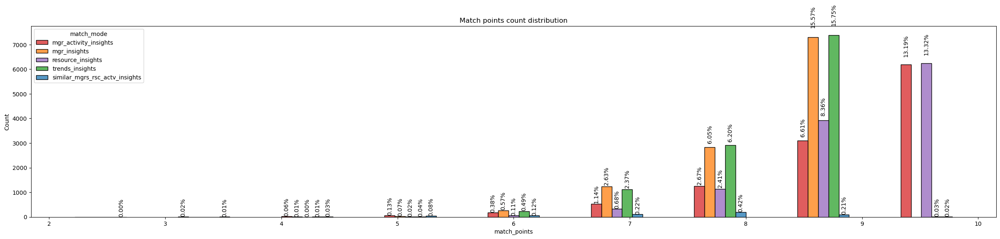

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 1 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11364 (59.650%)             False-Negative: 19.600%, True-Positive: 20.750%             (PTLTL 
:80.400%), AMB: 0.000%

Remain Deny :: 147 (15.490%)         True-Negative: 82.192%, False-Positive: 2.318%, AMB: 0.000%

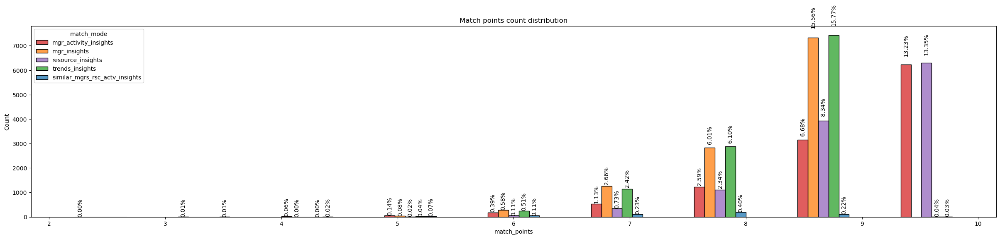

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 2 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11344 (59.545%)             False-Negative: 19.716%, True-Positive: 20.739%             (PTLTL 
:80.284%), AMB: 0.000%

Remain Deny :: 157 (16.544%)         True-Negative: 81.138%, False-Positive: 2.318%, AMB: 0.000%

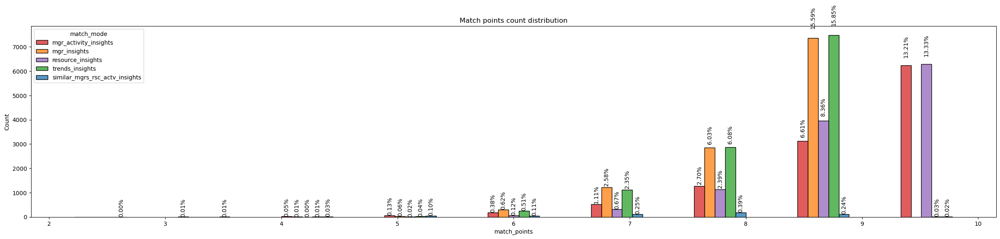

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 3 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11330 (59.472%)             False-Negative: 19.768%, True-Positive: 20.760%             (PTLTL 
:80.232%), AMB: 0.000%

Remain Deny :: 153 (16.122%)         True-Negative: 82.192%, False-Positive: 1.686%, AMB: 0.000%

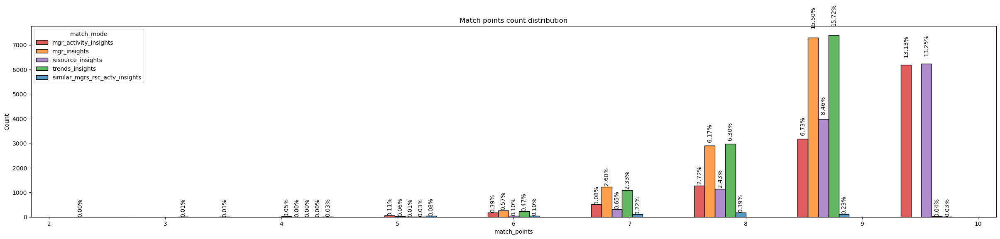

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 4 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11286 (59.241%)             False-Negative: 19.600%, True-Positive: 21.159%             (PTLTL 
:80.400%), AMB: 0.000%

Remain Deny :: 146 (15.385%)         True-Negative: 82.403%, False-Positive: 2.213%, AMB: 0.000%

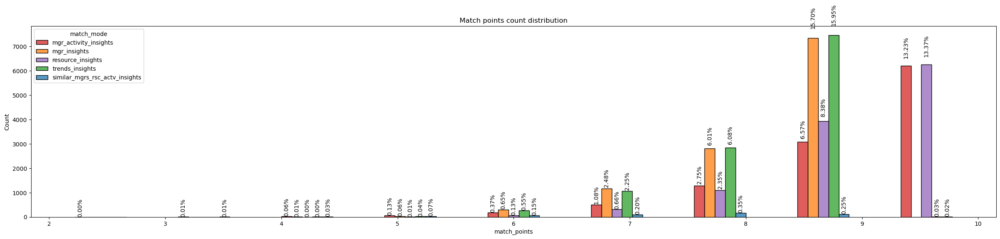

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 5 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11276 (59.188%)             False-Negative: 19.847%, True-Positive: 20.965%             (PTLTL 
:80.153%), AMB: 0.000%

Remain Deny :: 150 (15.806%)         True-Negative: 81.243%, False-Positive: 2.950%, AMB: 0.000%

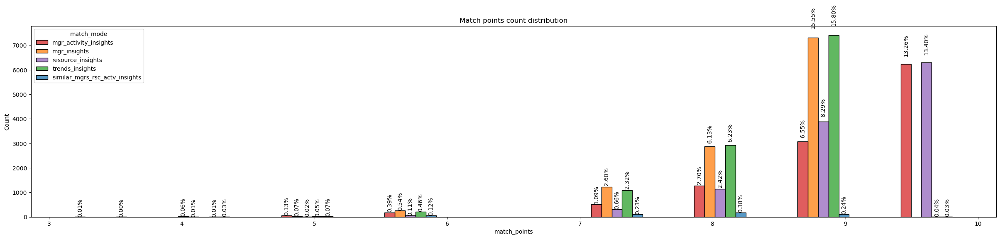

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 6 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11267 (59.141%)             False-Negative: 19.936%, True-Positive: 20.923%             (PTLTL 
:80.064%), AMB: 0.000%

Remain Deny :: 158 (16.649%)         True-Negative: 81.138%, False-Positive: 2.213%, AMB: 0.000%

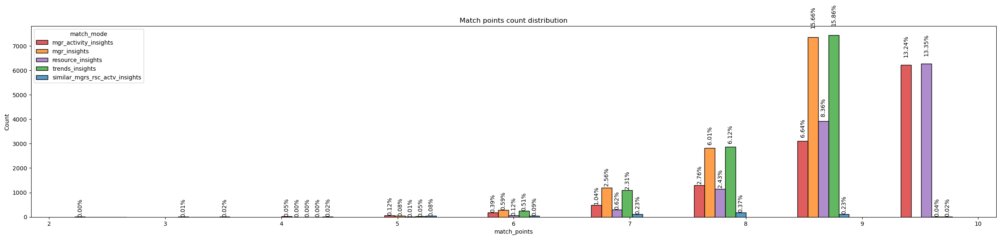

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 7 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11383 (59.750%)             False-Negative: 19.521%, True-Positive: 20.729%             (PTLTL 
:80.479%), AMB: 0.000%

Remain Deny :: 145 (15.279%)         True-Negative: 83.140%, False-Positive: 1.581%, AMB: 0.000%

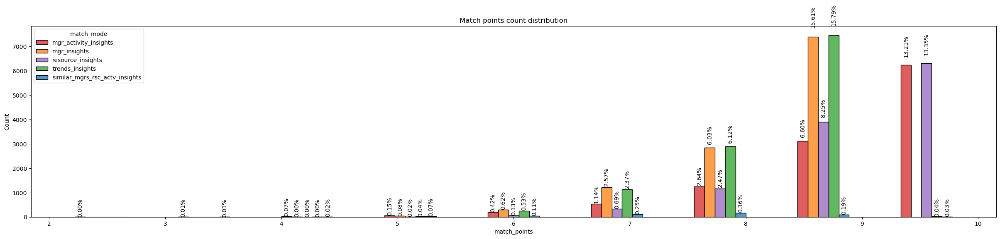

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 8 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11309 (59.362%)             False-Negative: 19.705%, True-Positive: 20.933%             (PTLTL 
:80.295%), AMB: 0.000%

Remain Deny :: 156 (16.438%)         True-Negative: 82.403%, False-Positive: 1.159%, AMB: 0.000%

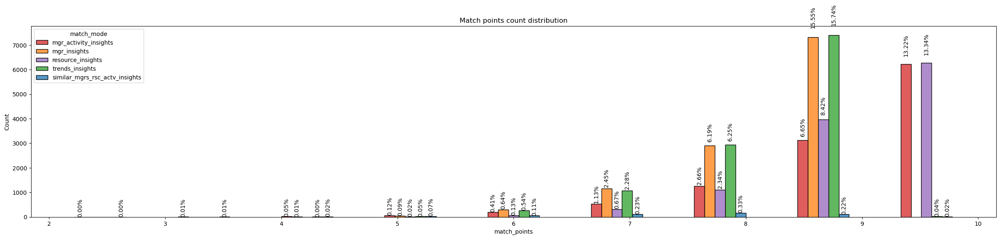

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 9 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 11257 (59.089%)             False-Negative: 20.015%, True-Positive: 20.897%             (PTLTL 
:79.985%), AMB: 0.000%

Remain Deny :: 154 (16.228%)         True-Negative: 81.981%, False-Positive: 1.791%, AMB: 0.000%

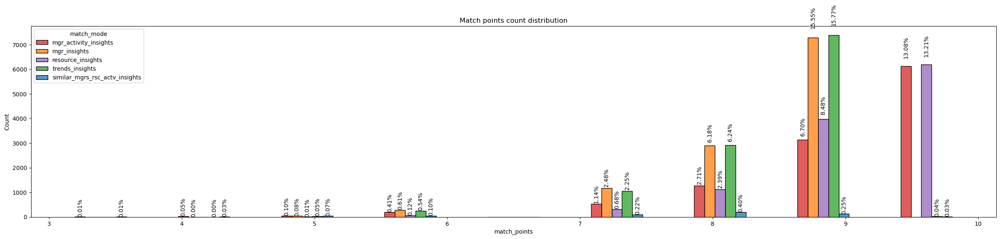

In [696]:
lineup_dataframe(match_mode = trends_insights_match_mode, 
                 match_points_count = trends_insights_match_points, 
                 ar_lims = trends_insights_ar_lims, plot_graph = True)

### Identify Resource-Insights Indicators

#### Identify Resource-Insights Indicators - level 1

Max False-Negative will not exceed 22.5%

In [697]:
%%time
rsrc_th_1_df = calc_mgr_th(fn_th = 0.225, match_mode=['resource_insights'])

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 822/1100 [14:40<04:57,  1.07s/it]

CPU times: user 9min 58s, sys: 2min 14s, total: 12min 13s
Wall time: 14min 40s


In [698]:
ar_lim_rsrc_1, rsrc_match_point_1 = find_ar_lim(rsrc_th_1_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.224083,0.211695,0.858799,0.017914,0.8,5,0.04075,0.559847,False
1,1,0.222718,0.207496,0.853530,0.023182,0.8,5,0.04050,0.560579,False
2,2,0.223033,0.207391,0.841939,0.023182,0.8,5,0.03995,0.560483,False
3,3,0.224660,0.207601,0.853530,0.016860,0.8,5,0.04050,0.559580,False
4,4,0.222141,0.211590,0.848261,0.022129,0.8,5,0.04025,0.560906,False
5,5,0.224240,0.209648,0.838778,0.029505,0.8,5,0.03980,0.559880,False
6,6,0.216314,0.209228,0.830348,0.022129,0.8,4,0.03940,0.563991,False
7,7,0.221406,0.207286,0.864067,0.015806,0.8,5,0.04100,0.561194,False
8,8,0.214477,0.209333,0.848261,0.011591,0.8,4,0.04025,0.564833,False
9,9,0.216472,0.208965,0.839831,0.017914,0.8,4,0.03985,0.563859,False


ar_lim: 0.8, match_point: [1, 2, 3, 4, 5]


In [699]:
ar_lim_rsrc_range = generate_ar_lim_range(ar_lim_rsrc_1)
ar_lim_rsrc_range

array([0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85,
       0.86])

#### Identify Resource-Insights Indicators - level 2

Max False-Negative will not exceed 22.5%, with an accurate ar_lim range to look in

In [700]:
%%time
rsrc_th_2_df = calc_mgr_th(fn_th = 0.225, match_mode=['resource_insights'], 
                              ar_lims = ar_lim_rsrc_range)

 41%|███████████████████████████████████████████████████████████████████████                                                                                                       | 490/1200 [08:43<12:38,  1.07s/it]

CPU times: user 7min 2s, sys: 1min 18s, total: 8min 20s
Wall time: 8min 43s


In [714]:
ar_lim_rsrc_2, rsrc_match_point_2 = find_ar_lim(rsrc_th_2_df)

,i,FN,TP,TN,FP,ar_lim,match_point,specificity,f1score,fn_exceeded
0,0,0.222980,0.211695,0.861960,0.017914,0.82,4,0.04090,0.560396,False
1,1,0.224555,0.207496,0.861960,0.023182,0.85,3,0.04090,0.559585,False
2,2,0.224818,0.207391,0.852476,0.023182,0.85,3,0.04045,0.559505,False
3,3,0.222613,0.207601,0.854584,0.016860,0.84,3,0.04055,0.560627,False
4,4,0.224398,0.211590,0.859852,0.022129,0.83,4,0.04080,0.559679,False
5,5,0.221878,0.209648,0.847208,0.029505,0.86,2,0.04020,0.561046,False
6,6,0.224555,0.209228,0.842993,0.022129,0.86,2,0.04000,0.559694,False
7,7,0.224870,0.207286,0.870390,0.015806,0.85,3,0.04130,0.559375,False
8,8,0.224608,0.209333,0.861960,0.011591,0.82,4,0.04090,0.559558,False
9,9,0.224555,0.208965,0.850369,0.017914,0.82,4,0.04035,0.559652,False


ar_lim: 0.8200000000000001, match_point: [1, 2, 3, 4]


In [711]:
resources_insights_match_mode = ["resource_insights"]
resources_insights_match_points = list(rsrc_match_point_2)
resources_insights_ar_lims = [ar_lim_rsrc_2]

#### Identify Resource-Insights Indicators - Lineup validation Datasets


*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 0 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10770 (56.532%)             False-Negative: 22.298%, True-Positive: 21.169%             (PTLTL 
:77.702%), AMB: 0.000%

Remain Deny :: 114 (12.013%)         True-Negative: 86.196%, False-Positive: 1.791%, AMB: 0.000%

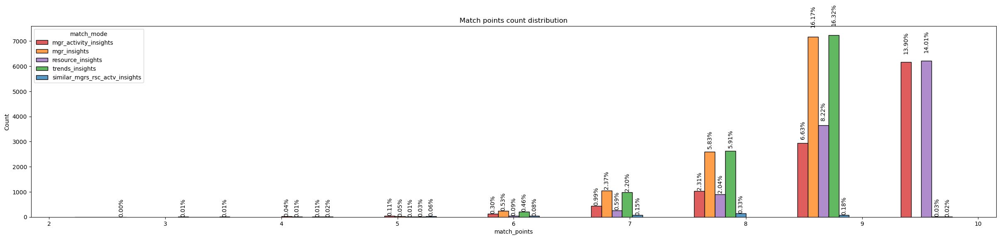

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 1 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10861 (57.010%)             False-Negative: 22.240%, True-Positive: 20.750%             (PTLTL 
:77.760%), AMB: 0.000%

Remain Deny :: 122 (12.856%)         True-Negative: 84.826%, False-Positive: 2.318%, AMB: 0.000%

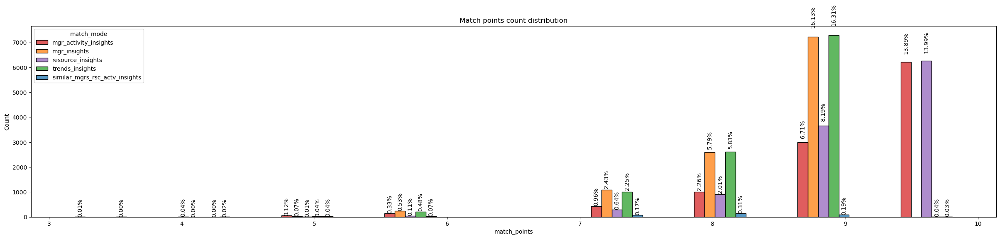

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 2 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10861 (57.010%)             False-Negative: 22.251%, True-Positive: 20.739%             (PTLTL 
:77.749%), AMB: 0.000%

Remain Deny :: 128 (13.488%)         True-Negative: 84.194%, False-Positive: 2.318%, AMB: 0.000%

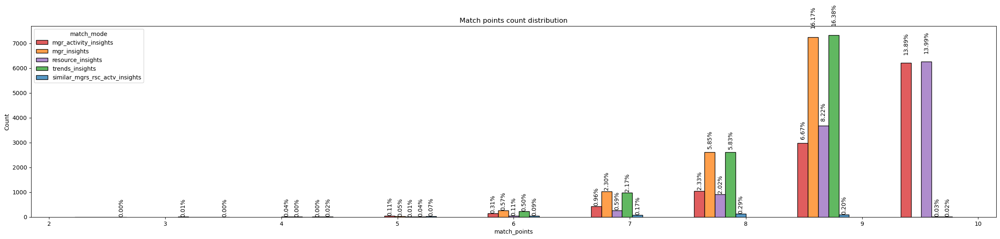

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 3 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10836 (56.879%)             False-Negative: 22.361%, True-Positive: 20.760%             (PTLTL 
:77.639%), AMB: 0.000%

Remain Deny :: 122 (12.856%)         True-Negative: 85.458%, False-Positive: 1.686%, AMB: 0.000%

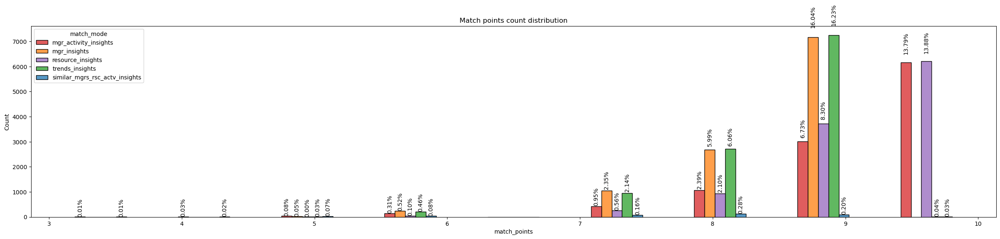

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 4 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10808 (56.732%)             False-Negative: 22.109%, True-Positive: 21.159%             (PTLTL 
:77.891%), AMB: 0.000%

Remain Deny :: 117 (12.329%)         True-Negative: 85.458%, False-Positive: 2.213%, AMB: 0.000%

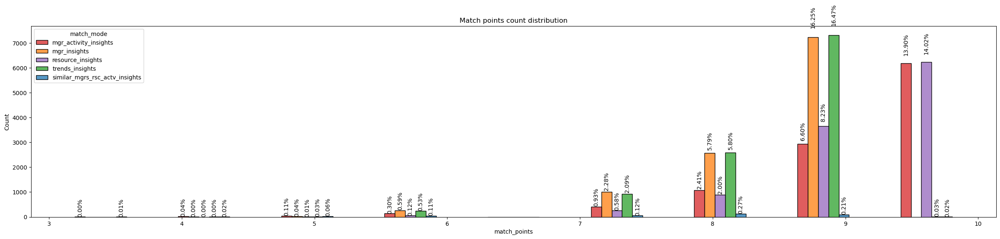

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 5 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10799 (56.685%)             False-Negative: 22.351%, True-Positive: 20.965%             (PTLTL 
:77.649%), AMB: 0.000%

Remain Deny :: 122 (12.856%)         True-Negative: 84.194%, False-Positive: 2.950%, AMB: 0.000%

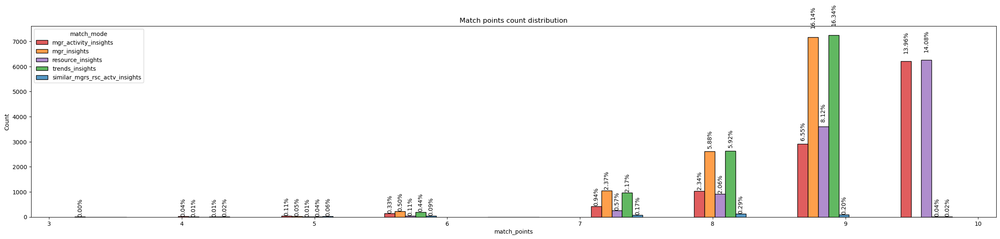

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 6 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10786 (56.616%)             False-Negative: 22.461%, True-Positive: 20.923%             (PTLTL 
:77.539%), AMB: 0.000%

Remain Deny :: 131 (13.804%)         True-Negative: 83.983%, False-Positive: 2.213%, AMB: 0.000%

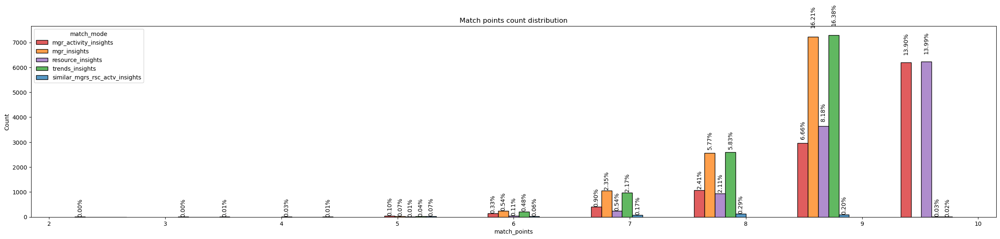

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 7 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10885 (57.136%)             False-Negative: 22.135%, True-Positive: 20.729%             (PTLTL 
:77.865%), AMB: 0.000%

Remain Deny :: 110 (11.591%)         True-Negative: 86.828%, False-Positive: 1.581%, AMB: 0.000%

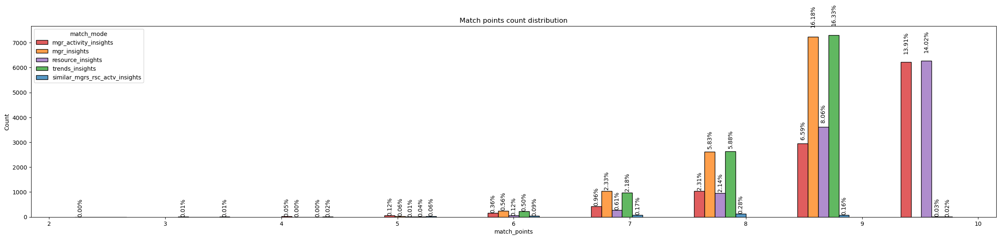

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 8 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10784 (56.606%)             False-Negative: 22.461%, True-Positive: 20.933%             (PTLTL 
:77.539%), AMB: 0.000%

Remain Deny :: 120 (12.645%)         True-Negative: 86.196%, False-Positive: 1.159%, AMB: 0.000%

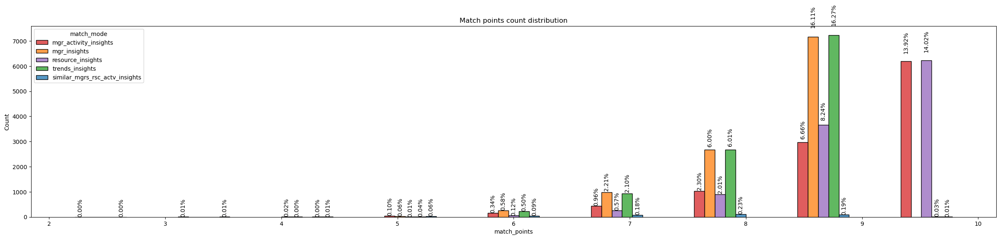

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ 9 ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Remain Allow:: 10792 (56.648%)             False-Negative: 22.456%, True-Positive: 20.897%             (PTLTL 
:77.544%), AMB: 0.000%

Remain Deny :: 125 (13.172%)         True-Negative: 85.037%, False-Positive: 1.791%, AMB: 0.000%

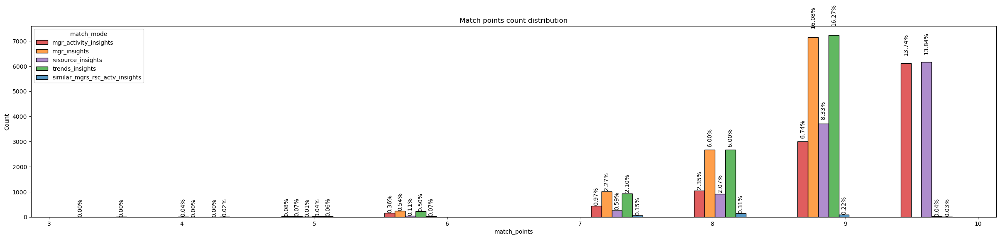

In [712]:
lineup_dataframe(match_mode = resources_insights_match_mode, 
                 match_points_count = resources_insights_match_points, 
                 ar_lims = resources_insights_ar_lims, plot_graph = True)

In [466]:
def plot_graphs():
    i=0
    for _x_validation in _x_validation_pool:
    
        pprint('*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*[ {0} ]*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*'.format(i))
        validation_results_mix_df = validation_results_mix_pool[i].copy()        
        ex_lst = list(set(indicators_array[i]['decied_indices'] + indicators_array[i]['approved_indices'] + indicators_array[i]['exclude_ambiguation']))

        test_results_mix_df_1 = validation_results_mix_df.copy().query(f'ind not in {ex_lst}')

        _=plot_match_points_count_distribution(test_results_mix_df_1, 'Match points count distribution')

        del test_results_mix_df_1

        i += 1
        pprint('\n')
    
    del i

In [ ]:
# plot_graphs()

# Model Evaluation

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15000/15000 [01:09<00:00, 215.46it/s]


Done

Test Allow Results match: 6,066,755

Test Allow Results match-not-found: 15,000

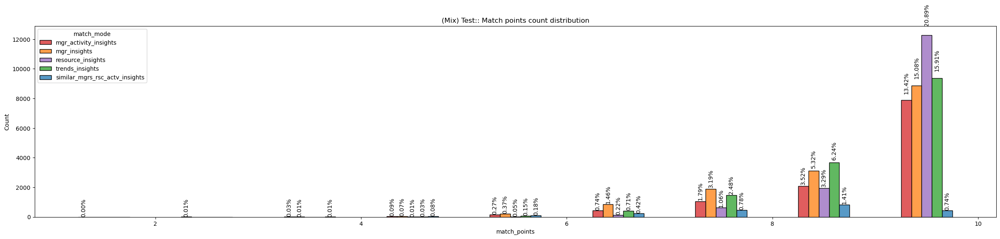

In [715]:
test_results_mix_df, test_results_mix_out_df = \
    get_validation_stat(insights_analyze_object, _df = _x_test, match_points_count_lim = 1)
    

pprint(f"Test Allow Results match: {len(test_results_mix_df):,}")
pprint(f"Test Allow Results match-not-found: {len(test_results_mix_out_df):,}")

validation_results_mix_df.to_parquet(f'./abac_research_outputs/model/test_results_mix_df.parquet', engine='pyarrow', index=True)
validation_results_mix_out_df.to_parquet(f'./abac_research_outputs/model/test_results_mix_out_df.parquet', engine='pyarrow', index=True)

_=plot_match_points_count_distribution(test_results_mix_df, f'(Mix) Test:: Match points count distribution')


### Initialize indicators

In [716]:
test_indicators_array = []
for i in range(0, 1):
    test_indicators_array.append({
        'decied_indices':[],
        'approved_indices':[],
        'exclude_ambiguation':[]
    })

### Base Status

Remain Allow:: 14288 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 712 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

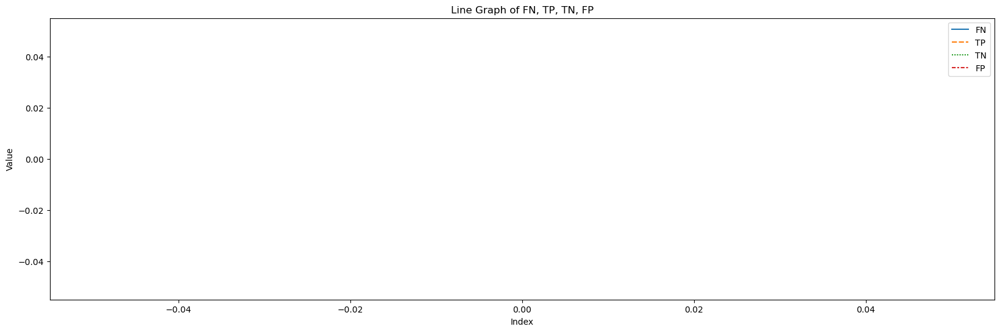

In [717]:
matrix_entries = []
_, matrix_entry = plot_status(_df= _x_test, curr_decied_indices = decied_indices,
                curr_approved_indices = approved_indices,
                curr_exclude_ambiguation=exclude_ambiguation)
matrix_entries.append(matrix_entry)
    

pprint('\n')

plot_fn_tp_tn_fp_graph(matrix_entries)
del matrix_entries

### Ambiguation

Train & Test cross data size: 3,002

Train & Test cross data size with more than a single entry: 8

ambiguation entries: [183789, 149670, 173908, 73638, 90792, 174980, 151664, 154504]

Remain Allow:: 14288 (100.000%)             False-Negative: 0.000%, True-Positive: 0.000%             (PTLTL 
:100.000%), AMB: 0.000%

Remain Deny :: 712 (100.000%)         True-Negative: 0.000%, False-Positive: 0.000%, AMB: 0.000%

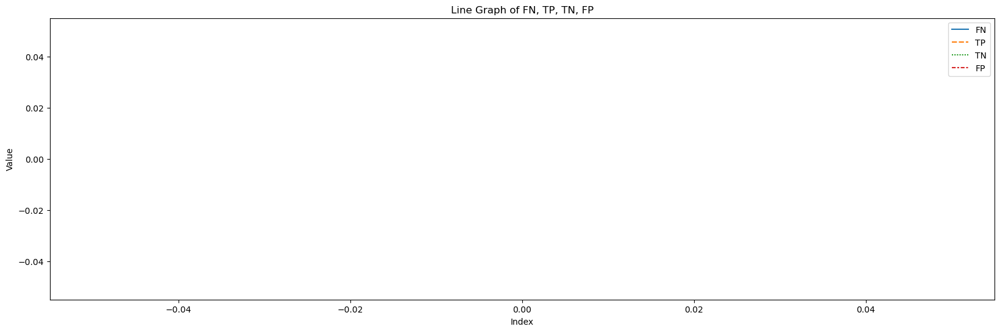

In [718]:
matrix_entries = []

exclude_ambiguation_indices = ambiguation_match(__x_train = _x_train, __x_validation = _x_test,
                                                is_validation = False)

pprint(f'ambiguation entries: {exclude_ambiguation_indices}\n')

_, matrix_entry = plot_status(_df= _x_test, curr_decied_indices = decied_indices,
                        curr_approved_indices = approved_indices,
                        curr_exclude_ambiguation=exclude_ambiguation)
matrix_entries.append(matrix_entry)

pprint('\n')

plot_fn_tp_tn_fp_graph(matrix_entries)
del matrix_entries

### Found Full Match

In [719]:
validation1_exclude_indices_deny, validation1_exclude_indices_allow = \
    validation1_exclude_found_full_match(__x_train = _x_train, __x_validation = _x_test,
                                         exclude_ambiguation = exclude_ambiguation)

_, matrix_entry = plot_status(_df= _x_test, 
                curr_decied_indices=(validation1_exclude_indices_deny),
                curr_approved_indices=(validation1_exclude_indices_allow), 
                curr_exclude_ambiguation=exclude_ambiguation)

test_indicators_array[0]={
    'decied_indices':validation1_exclude_indices_deny,
    'approved_indices':validation1_exclude_indices_allow,
    'exclude_ambiguation':exclude_ambiguation
}

pprint('\n')
pprint(matrix_entry)
pprint('\n')


Train & Validation cross data size: 3,002

exclude_indices_deny: 19

exclude_indices_allow: 2,975

Remain Allow:: 11308 (79.143%)             False-Negative: 0.133%, True-Positive: 20.724%             (PTLTL 
:99.867%), AMB: 0.000%

Remain Deny :: 696 (97.753%)         True-Negative: 0.000%, False-Positive: 2.247%, AMB: 0.000%

{'FN': 0.0013297872340425532, 'TP': 0.20723684210526316, 'TN': 0.0, 'FP': 0.02247191011235955}

In [720]:
def lineup_dataframe_test(match_mode = ["mgr_insights"], match_points_count = [1], ar_lim = 0.9, plot_graph = True):
    
    ex_lst = list(set(test_indicators_array[0]['decied_indices'] + test_indicators_array[0]['approved_indices'] + test_indicators_array[0]['exclude_ambiguation']))
    _indices_deny = list(set(test_indicators_array[0]['decied_indices']))

    j = len(match_points_count)
    for match_point in match_points_count:

        j -= 1
        show_plot = (j ==0)
        
        counts_deny_arr = test_results_mix_df.query(f'ind not in {ex_lst}').\
            query(f'match_points_count in {[match_point]}').\
            query(f'ar < {ar_lim}').query(f'match_mode in {match_mode} ')[['ind']].drop_duplicates()[['ind']]

        counts_deny_arr = counts_deny_arr['ind'].to_list()
    
        _indices_deny = list(set(_indices_deny+counts_deny_arr))
    
        _, matrix_entry = plot_status(_df= _x_test, 
                                      curr_decied_indices=_indices_deny,
                                      curr_approved_indices=test_indicators_array[0]['approved_indices'], 
                                      curr_exclude_ambiguation=test_indicators_array[0]['exclude_ambiguation'],
                                      show_plot = show_plot)

        existing_decied_indices = list(test_indicators_array[i]['decied_indices'])
        test_indicators_array[i]['decied_indices'] = list(set( existing_decied_indices + counts_deny_arr))

        if plot_graph and show_plot:
            ex_lst = list(set(ex_lst + counts_deny_arr ))

            test_results_mix_df_1 = test_results_mix_df.copy().query(f'ind not in {ex_lst}')

            _=plot_match_points_count_distribution(test_results_mix_df_1, 'Match points count distribution')

            del test_results_mix_df_1


### Identify Manager-Insight Entries

In [721]:
# mgr_insights_match_mode = ["mgr_insights"]
# mgr_insights_match_points = list(mgr_match_point_2)
# mgr_insights_ar_lims = [ar_lim_mgr_2]

In [722]:
pprint(len(test_indicators_array[0]['decied_indices']), 
       len(test_indicators_array[0]['approved_indices']),
       len(test_indicators_array[0]['exclude_ambiguation']))

19 2975 0

Remain Allow:: 9203 (64.411%)             False-Negative: 14.866%, True-Positive: 20.724%             (PTLTL 
:85.134%), AMB: 0.000%

Remain Deny :: 190 (26.685%)         True-Negative: 71.067%, False-Positive: 2.247%, AMB: 0.000%

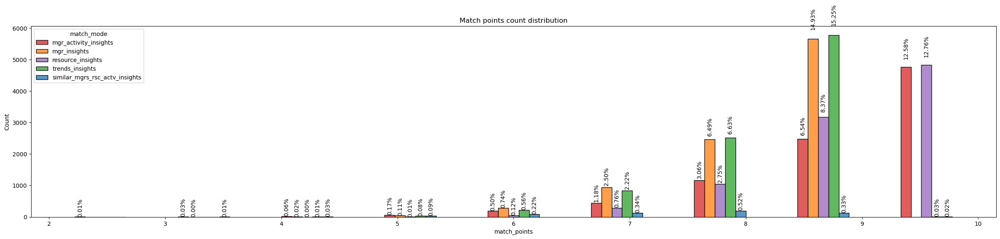

In [723]:
lineup_dataframe_test(match_mode = mgr_insights_match_mode, 
                      match_points_count = mgr_insights_match_points, 
                      ar_lim = mgr_insights_ar_lims[0], plot_graph = True)

### Identify Similar-Manager-Insight Entries

In [724]:
# sim_mgr_insights_match_mode = ["similar_mgrs_rsc_actv_insights"]
# sim_mgr_insights_match_points = list(sim_mgr_match_point_2)
# sim_mgr_insights_ar_lims = [ar_lim_sim_mgr_2]

Remain Allow:: 9127 (63.879%)             False-Negative: 15.398%, True-Positive: 20.724%             (PTLTL 
:84.602%), AMB: 0.000%

Remain Deny :: 174 (24.438%)         True-Negative: 73.315%, False-Positive: 2.247%, AMB: 0.000%

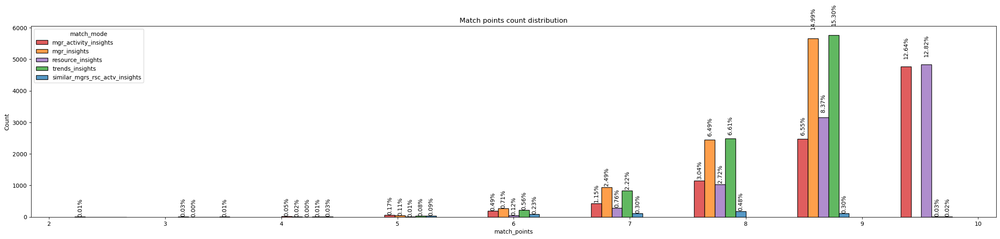

In [725]:
lineup_dataframe_test(match_mode = sim_mgr_insights_match_mode, 
                      match_points_count = sim_mgr_insights_match_points, 
                      ar_lim = sim_mgr_insights_ar_lims[0], plot_graph = True)

In [750]:
### Identify Manager-Activity-Insights Entries

In [751]:
# actv_mgr_insights_match_mode = ["mgr_activity_insights"]
# actv_mgr_insights_match_points = list(actv_mgr_match_point_2)
# actv_mgr_insights_ar_lims = [ar_lim_actv_mgr_2]

In [752]:
# lineup_dataframe_test(match_mode = actv_mgr_insights_match_mode, 
#                       match_points_count = actv_mgr_insights_match_points, 
#                       ar_lim = actv_mgr_insights_ar_lims[0], plot_graph = True)

### Identify Trends-Insights Entyries

In [726]:
# trends_insights_match_mode = ["trends_insights"]
# trends_insights_match_points = list(trnd_match_point_2)
# trends_insights_ar_lims = [ar_lim_trnd_2]

Remain Allow:: 8440 (59.071%)             False-Negative: 20.206%, True-Positive: 20.724%             (PTLTL 
:79.794%), AMB: 0.000%

Remain Deny :: 127 (17.837%)         True-Negative: 79.916%, False-Positive: 2.247%, AMB: 0.000%

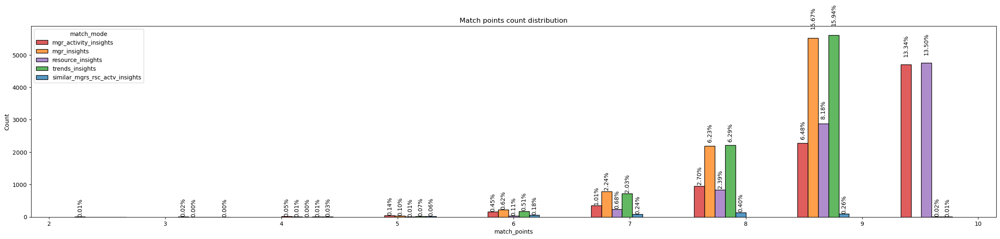

In [727]:
lineup_dataframe_test(match_mode = trends_insights_match_mode, 
                      match_points_count = trends_insights_match_points, 
                      ar_lim = trends_insights_ar_lims[0], plot_graph = True)

### Identify Resource-Insights Entries

In [728]:
# resources_insights_match_mode = ["resource_insights"]
# resources_insights_match_points = list(rsrc_match_point_2)
# resources_insights_ar_lims = [ar_lim_rsrc_2]

Remain Allow:: 8073 (56.502%)             False-Negative: 22.774%, True-Positive: 20.724%             (PTLTL 
:77.226%), AMB: 0.000%

Remain Deny :: 103 (14.466%)         True-Negative: 83.287%, False-Positive: 2.247%, AMB: 0.000%

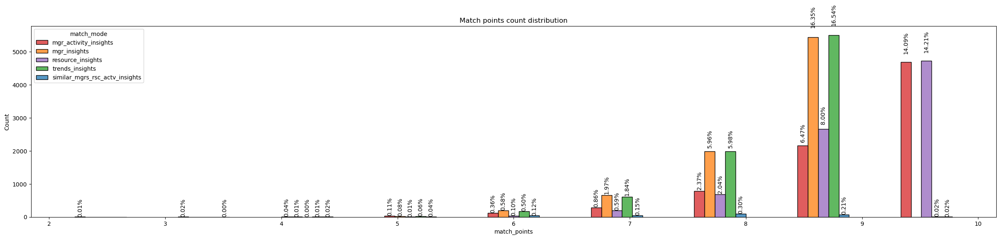

In [729]:
lineup_dataframe_test(match_mode = resources_insights_match_mode, 
                      match_points_count = resources_insights_match_points, 
                      ar_lim = resources_insights_ar_lims[0], plot_graph = True)

### Factors

In [730]:
_x_test_scores = _x_test.copy()
_x_test_scores['Actual'] = _x_test_scores['action'].apply(lambda x: 1 if x else 0)

In [731]:
_x_test_scores = _x_test_scores.reset_index()
inds_ex_ex = list(test_indicators_array[0]['decied_indices'])
_x_test_scores['Prediction'] = _x_test_scores['index'].apply(lambda x: 0 if x in inds_ex_ex else 1 )

In [732]:
_x_test_scores= _x_test_scores.set_index('index')
_x_test_scores = _x_test_scores[['Actual', 'Prediction']]

In [733]:
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef, balanced_accuracy_score, roc_auc_score, average_precision_score, confusion_matrix

# Sample data: true labels and predicted labels
y_true = _x_test_scores['Actual']  # True labels
y_pred = _x_test_scores['Prediction']  # Predicted labels

# Calculate Precision
precision = precision_score(y_true, y_pred)
pprint(f'Precision: {precision:.2f}')

# Calculate Recall
recall = recall_score(y_true, y_pred)
pprint(f'Recall: {recall:.2f}')

# Calculate F1-Score
f1 = f1_score(y_true, y_pred)
pprint(f'F1-Score: {f1:.2f}')

# Calculate F2-Score
f2 = (5 * precision * recall) / (4 * precision + recall) if (4 * precision + recall) != 0 else 0
pprint(f'F2-Score: {f2:.2f}')

# Calculate F0.5-Score
f05 = (1.25 * precision * recall) / (0.25 * precision + recall) if (0.25 * precision + recall) != 0 else 0
pprint(f'F0.5-Score: {f05:.2f}')

# Calculate Matthews Correlation Coefficient (MCC)
mcc = matthews_corrcoef(y_true, y_pred)
pprint(f'Matthews Correlation Coefficient (MCC): {mcc:.2f}')

# Calculate Balanced Accuracy
balanced_acc = balanced_accuracy_score(y_true, y_pred)
pprint(f'Balanced Accuracy: {balanced_acc:.2f}')

# Calculate Specificity
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
specificity = tn / (tn + fp) if (tn + fp) != 0 else 0
pprint(f'Specificity: {specificity:.2f}')

# Calculate Area Under the ROC Curve (AUC-ROC)
roc_auc = roc_auc_score(y_true, y_pred)
pprint(f'Area Under the ROC Curve (AUC-ROC): {roc_auc:.2f}')

# Calculate Area Under the Precision-Recall Curve (AUC-PR)
auc_pr = average_precision_score(y_true, y_pred)
pprint(f'Area Under the Precision-Recall Curve (AUC-PR): {auc_pr:.2f}')

Precision: 0.99

Recall: 0.77

F1-Score: 0.87

F2-Score: 0.81

F0.5-Score: 0.94

Matthews Correlation Coefficient (MCC): 0.29

Balanced Accuracy: 0.80

Specificity: 0.83

Area Under the ROC Curve (AUC-ROC): 0.80

Area Under the Precision-Recall Curve (AUC-PR): 0.98

Precision: 0.99
Recall: 0.77
F1-Score: 0.87
F2-Score: 0.81
F0.5-Score: 0.94
Matthews Correlation Coefficient (MCC): 0.29
Balanced Accuracy: 0.80
Area Under the ROC Curve (AUC-ROC): 0.80
Area Under the Precision-Recall Curve (AUC-PR): 0.98


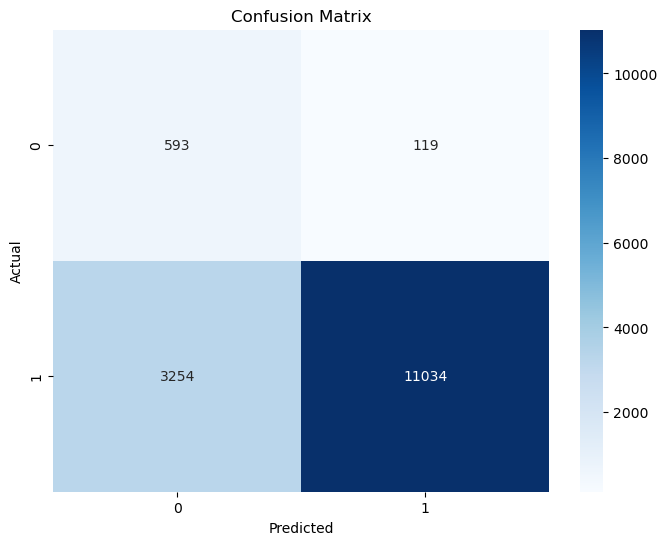

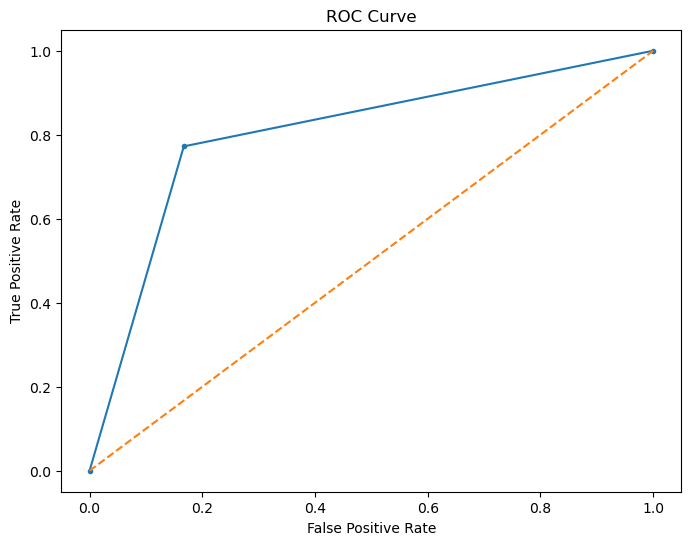

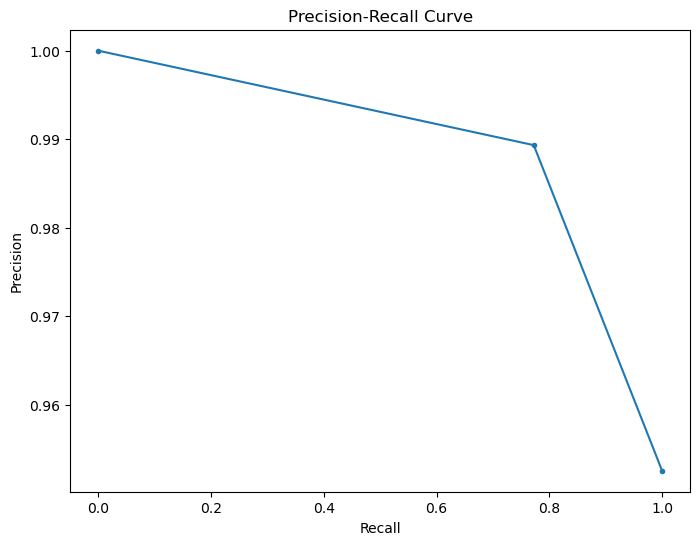

In [734]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef, balanced_accuracy_score, roc_auc_score, average_precision_score, roc_curve, precision_recall_curve

# Sample data: true labels and predicted labels
y_true = _x_test_scores['Actual']  # True labels
y_pred = _x_test_scores['Prediction']  # Predicted labels

# Calculate metrics
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
f2 = (5 * precision * recall) / (4 * precision + recall) if (4 * precision + recall) != 0 else 0
f05 = (1.25 * precision * recall) / (0.25 * precision + recall) if (0.25 * precision + recall) != 0 else 0
mcc = matthews_corrcoef(y_true, y_pred)
balanced_acc = balanced_accuracy_score(y_true, y_pred)
roc_auc = roc_auc_score(y_true, y_pred)
auc_pr = average_precision_score(y_true, y_pred)

# Print metrics
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')
print(f'F2-Score: {f2:.2f}')
print(f'F0.5-Score: {f05:.2f}')
print(f'Matthews Correlation Coefficient (MCC): {mcc:.2f}')
print(f'Balanced Accuracy: {balanced_acc:.2f}')
print(f'Area Under the ROC Curve (AUC-ROC): {roc_auc:.2f}')
print(f'Area Under the Precision-Recall Curve (AUC-PR): {auc_pr:.2f}')

# Plotting functions
def plot_confusion_matrix(y_true, y_pred):
    from sklearn.metrics import confusion_matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

def plot_roc_curve(y_true, y_pred):
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show()

def plot_precision_recall_curve(y_true, y_pred):
    precision, recall, _ = precision_recall_curve(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

# Plot graphs
plot_confusion_matrix(y_true, y_pred)
plot_roc_curve(y_true, y_pred)
plot_precision_recall_curve(y_true, y_pred)

# Conclusions

### Model Performance Metrics

These metrics provide a comprehensive evaluation of the model's performance, particularly in binary classification tasks:

1. **Precision (0.99)**: 
   - Indicates the accuracy of positive predictions.
   - A precision of 0.99 means that 99% of the instances labeled as positive by the model are actually positive.
   - This high precision suggests that the model has very few false positives.

2. **Recall (0.77)**: 
   - Measures the ability of the model to identify actual positives.
   - A recall of 0.77 indicates that the model correctly identifies 77% of all actual positive cases, but it may miss some positives (false negatives).

3. **F1-Score (0.87)**: 
   - The harmonic mean of precision and recall, providing a single metric that balances both.
   - An F1-Score of 0.87 shows that the model has a good balance between precision and recall, though recall is somewhat lower than precision.

4. **F2-Score (0.81)**: 
   - Similar to the F1-Score but gives more weight to recall.
   - An F2-Score of 0.81 indicates that the model is more recall-sensitive than with the F1-Score, yet it still reflects a lower recall compared to precision.

5. **F0.5-Score (0.94)**: 
   - This score gives more weight to precision than recall.
   - With a value of 0.94, it indicates that the model is highly precise, even at the expense of missing some positives.

6. **Matthews Correlation Coefficient (MCC) (0.29)**: 
   - Measures the quality of binary classifications.
   - An MCC of 0.29 suggests a weak positive correlation between the predicted and actual classes, indicating that the model might not be performing well across all classes or that the data could be imbalanced.

7. **Balanced Accuracy (0.80)**: 
   - The average of sensitivity (recall) and specificity, providing an overall accuracy that accounts for class imbalance.
   - A balanced accuracy of 0.80 indicates that the model is fairly good at correctly identifying both positives and negatives.

8. **Specificity (0.83)**: 
   - Measures the proportion of true negatives that are correctly identified.
   - A specificity of 0.83 means that 83% of actual negatives are correctly classified, suggesting that the model is good at avoiding false positives.

9. **Area Under the ROC Curve (AUC-ROC) (0.80)**: 
   - Indicates the model's ability to distinguish between positive and negative classes across different thresholds.
   - An AUC-ROC of 0.80 shows that the model has a decent ability to separate the two classes.

10. **Area Under the Precision-Recall Curve (AUC-PR) (0.98)**: 
    - Reflects the trade-off between precision and recall across different thresholds.
    - A high AUC-PR of 0.98 suggests that the model maintains high precision even as recall increases, indicating very good performance in scenarios where the positive class is more critical.

### Summary
The model demonstrates very high precision (0.99) but has a slightly lower recall (0.77), which results in an F1-Score of 0.87. The F0.5-Score of 0.94 emphasizes precision, while the F2-Score of 0.81 reflects a focus on recall, albeit lower overall. The MCC of 0.29 indicates potential issues with class imbalance or overall prediction quality. The model has good balanced accuracy (0.80) and specificity (0.83), meaning it correctly identifies both positives and negatives fairly well. The high AUC-PR (0.98) indicates excellent performance in scenarios where precision is crucial, while the AUC-ROC (0.80) shows reasonable discrimination between classes.